### **Installing the required modules**

In [ ]:
pip install pandas matplotlib seaborn numpy scikit-learn Pillow wordcloud textblob nltk

### **Mounting the google drive**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


### **Creating dataframes data and tweets**

In [ ]:
import pandas as pd

#Based Path for csv files
base_path = '/content/drive/My Drive/web_mining_project/'

# Reading the csv files to create daatframes
data = pd.read_csv(base_path + 'covid-19-all.csv',
                   usecols=['Country/Region', 'Province/State', 'Latitude', 'Longitude',
                            'Confirmed', 'Recovered', 'Deaths', 'Date'],
                   dtype={'Country/Region': str, 'Province/State': str, 'Latitude': float,
                          'Longitude': float, 'Confirmed': float, 'Recovered': float,
                          'Deaths': float},
                   parse_dates=['Date'])
data.rename(columns={"Country/Region": "Country", "Province/State": "State"}, inplace=True)

tweets = pd.read_csv(base_path + 'covid19_tweets.csv',
                     usecols=['user_name', 'user_location', 'user_description',
                              'user_created', 'user_followers', 'user_friends',
                              'user_favourites', 'user_verified', 'date', 'text',
                              'hashtags', 'source', 'is_retweet'],
                     dtype={'user_name': str, 'user_location': str,
                            'user_description': str, 'user_followers': float,
                            'user_friends': float, 'user_favourites': float,
                            'user_verified': bool, 'text': str,
                            'hashtags': str, 'source': str, 'is_retweet': bool},
                     parse_dates=['user_created', 'date'])



In [ ]:
import pandas as pd
base_path = '/content/drive/My Drive/web_mining_project/'
data1 = pd.read_csv(base_path + 'covid-19-all-200.csv',
                   usecols=['Country/Region', 'Province/State', 'Latitude', 'Longitude',
                            'Confirmed', 'Recovered', 'Deaths', 'Date'],
                   dtype={'Country/Region': str, 'Province/State': str, 'Latitude': float,
                          'Longitude': float, 'Confirmed': float, 'Recovered': float,
                          'Deaths': float},
                   parse_dates=['Date'])



### **EDA: Exploratory Data Analysis**

In [ ]:
# Read the top 5 rows of data dataframe
data.head(5)

,Country,State,Latitude,Longitude,Confirmed,Recovered,Deaths,Date
0,China,Anhui,31.8257,117.2264,1.0,NaN,NaN,2020-01-22
1,China,Beijing,40.1824,116.4142,14.0,NaN,NaN,2020-01-22
2,China,Chongqing,30.0572,107.8740,6.0,NaN,NaN,2020-01-22
3,China,Fujian,26.0789,117.9874,1.0,NaN,NaN,2020-01-22
4,China,Gansu,35.7518,104.2861,NaN,NaN,NaN,2020-01-22


In [ ]:
# Read the top 5 rows of tweets dataframe
tweets.head(5)

,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,is_retweet
0,ᏉᎥ☻լꂅϮ,astroworld,wednesday addams as a disney princess keepin i...,2017-05-26 05:46:42,624.0,950.0,18775.0,False,2020-07-25 12:27:21,If I smelled the scent of hand sanitizers toda...,NaN,Twitter for iPhone,False
1,Tom Basile 🇺🇸,"New York, NY","Husband, Father, Columnist & Commentator. Auth...",2009-04-16 20:06:23,2253.0,1677.0,24.0,True,2020-07-25 12:27:17,Hey @Yankees @YankeesPR and @MLB - wouldn't it...,NaN,Twitter for Android,False
2,Time4fisticuffs,"Pewee Valley, KY",#Christian #Catholic #Conservative #Reagan #Re...,2009-02-28 18:57:41,9275.0,9525.0,7254.0,False,2020-07-25 12:27:14,@diane3443 @wdunlap @realDonaldTrump Trump nev...,['COVID19'],Twitter for Android,False
3,ethel mertz,Stuck in the Middle,#Browns #Indians #ClevelandProud #[]_[] #Cavs ...,2019-03-07 01:45:06,197.0,987.0,1488.0,False,2020-07-25 12:27:10,@brookbanktv The one gift #COVID19 has give me...,['COVID19'],Twitter for iPhone,False
4,DIPR-J&K,Jammu and Kashmir,🖊️Official Twitter handle of Department of Inf...,2017-02-12 06:45:15,101009.0,168.0,101.0,False,2020-07-25 12:27:08,25 July : Media Bulletin on Novel #CoronaVirus...,"['CoronaVirusUpdates', 'COVID19']",Twitter for Android,False


In [ ]:
len(tweets)

179108

In [ ]:
len(data)

515800

In [ ]:
# Understanding the column and datatypes of tweets dataframe
tweets.dtypes

user_name                   object
user_location               object
user_description            object
user_created        datetime64[ns]
user_followers             float64
user_friends               float64
user_favourites            float64
user_verified                 bool
date                datetime64[ns]
text                        object
hashtags                    object
source                      object
is_retweet                    bool
dtype: object

In [ ]:
# Understanding the column and datatypes of data dataframe
data.dtypes

Country              object
State                object
Latitude            float64
Longitude           float64
Confirmed           float64
Recovered           float64
Deaths              float64
Date         datetime64[ns]
dtype: object

### **Vyabhavi**

### **Machine Learning Algorithms**

### **Random Forest Classifier**

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score

# A new dataframe is created using a copy of the data dataframe
covid_df = data.copy()

# The missing values are dropped from the columns
covid_df = covid_df.dropna(subset=['Latitude', 'Longitude', 'Confirmed'])

# A new binary column 'Severe' is created based on a threshold of confirmed cases i.e 50
threshold = 50
covid_df['Severe'] = (covid_df['Confirmed'] > threshold).astype(int)

# The independent and dependent variables are selected
X = covid_df[['Latitude', 'Longitude']]
y = covid_df['Severe']

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Random Forest Classifier model is created and fitted
model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

# The data is predicted for the test case values
y_pred = model.predict(X_test)

# The accuracy and classification report of the model is evaluated
print("Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:")
print(classification_report(y_test, y_pred))


Accuracy: 0.8299177944084687

Classification Report:
              precision    recall  f1-score   support

           0       0.83      0.80      0.82     48401
           1       0.83      0.85      0.84     54755

    accuracy                           0.83    103156
   macro avg       0.83      0.83      0.83    103156
weighted avg       0.83      0.83      0.83    103156



### **Linear Regression**

In [ ]:
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Split the data into training and test sets
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

# Linear Regression model is created and fitted
mod_lin = LinearRegression()
mod_lin.fit(X_train,y_train)

# The data is predicted for the test case values
y_pred = mod_lin.predict(X_test)

# Mean absolute error is calculated
mae = mean_absolute_error(y_test, y_pred)
print("Mean Absolute Error (MAE):", mae)

# Mean squared error is calculated
mse = mean_squared_error(y_test, y_pred)
print("Mean Squared Error (MSE):", mse)

# Root mean squared error is calculated
rmse = mean_squared_error(y_test, y_pred, squared=False)  # If squared=False, returns RMSE
print("Root Mean Squared Error (RMSE):", rmse)

# R² Score is calculated
r2 = r2_score(y_test, y_pred)
print("R-squared (R²):", r2)

Mean Absolute Error (MAE): 0.4678923741256554
Mean Squared Error (MSE): 0.23325346457410426
Root Mean Squared Error (RMSE): 0.4829632124438716
R-squared (R²): 0.06317208987989964


### **Decision Tree Regressor**

In [ ]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Decision Tree Regression model is created and fitted
mod_dec = DecisionTreeRegressor().fit(X_train, y_train)

# The data is predicted for the test case values
y_pred = mod_dec.predict(X_test)

# Calculate the Mean Absolute Error (MAE)
mae = mean_absolute_error(y_test, y_pred)
print("Mean Absolute Error (MAE):", mae)

# Calculate the Mean Squared Error (MSE)
mse = mean_squared_error(y_test, y_pred)
print("Mean Squared Error (MSE):", mse)

# Calculate the Root Mean Squared Error (RMSE)
rmse = mean_squared_error(y_test, y_pred, squared=False)
print("Root Mean Squared Error (RMSE):", rmse)

# Calculate the R-squared (R²) Score
r2 = r2_score(y_test, y_pred)
print("R-squared (R²):", r2)

Mean Absolute Error (MAE): 0.2316987901115548
Mean Squared Error (MSE): 0.11700729236204438
Root Mean Squared Error (RMSE): 0.3420632870713318
R-squared (R²): 0.5300575818991924


### **XGBoost Regressor**

In [ ]:
from xgboost.sklearn import XGBRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# XGBoost Regressor model is created and fitted
xgbmodel = XGBRegressor()
xgbmodel.fit(X_train,y_train)

# The data is predicted for the test case values
y_pred = xgbmodel.predict(X_test)

# Mean absolute error is calculated
mae = mean_absolute_error(y_test, y_pred)
print("Mean Absolute Error (MAE):", mae)

# Mean Squared Error is calculated
mse = mean_squared_error(y_test, y_pred)
print("Mean Squared Error (MSE):", mse)

# Root Mean Squared error is calculated
rmse = mean_squared_error(y_test, y_pred, squared=False)  # If squared=False, returns RMSE
print("Root Mean Squared Error (RMSE):", rmse)

# R² Score is calculated
r2 = r2_score(y_test, y_pred)
print("R-squared (R²):", r2)


Mean Absolute Error (MAE): 0.295132155528668
Mean Squared Error (MSE): 0.1367291868349898
Root Mean Squared Error (RMSE): 0.36976909935118946
R-squared (R²): 0.4508475207906303


### **Logistic Regression**

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report

# Logistic Regression model is created and fitted
model = LogisticRegression()
model.fit(X_train, y_train)

# The data is predicted for the test case values
y_pred = model.predict(X_test)

# The accuracy score is calculated
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

# The Classification report is evaluated
report = classification_report(y_test, y_pred)
print("\nClassification Report:\n", report)

Accuracy: 0.6467486137500484

Classification Report:
               precision    recall  f1-score   support

           0       0.63      0.60      0.61     48287
           1       0.66      0.69      0.67     54869

    accuracy                           0.65    103156
   macro avg       0.65      0.64      0.64    103156
weighted avg       0.65      0.65      0.65    103156



  ### **Vani**

### **KNeighborsClassifier**

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score

# Load your dataset - replace 'file_path' with the actual path to your csv file
covid_df = data.copy()

covid_df = covid_df.dropna(subset=['Latitude', 'Longitude', 'Confirmed'])

# Create a new binary column 'Severe' based on a threshold of confirmed cases
threshold = 50
covid_df['Severe'] = (covid_df['Confirmed'] > threshold).astype(int)

# Select the features and the target
X = covid_df[['Latitude', 'Longitude']]  # You might want to include more features here
y = covid_df['Severe']

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


knn = KNeighborsClassifier(n_neighbors=7)

knn.fit(X_train, y_train)

#predict the response
pred = knn.predict(X_test)

# Evaluate the model
print("Accuracy:", accuracy_score(y_test, pred))
report = classification_report(y_test, pred)
print("\nClassification Report:\n", report)

<ipython-input-6-859fe0a24db6>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  covid_df['Severe'] = (covid_df['Confirmed'] > threshold).astype(int)


Accuracy: 0.8114990887587731

Classification Report:
               precision    recall  f1-score   support

           0       0.81      0.79      0.80     48401
           1       0.82      0.83      0.82     54755

    accuracy                           0.81    103156
   macro avg       0.81      0.81      0.81    103156
weighted avg       0.81      0.81      0.81    103156



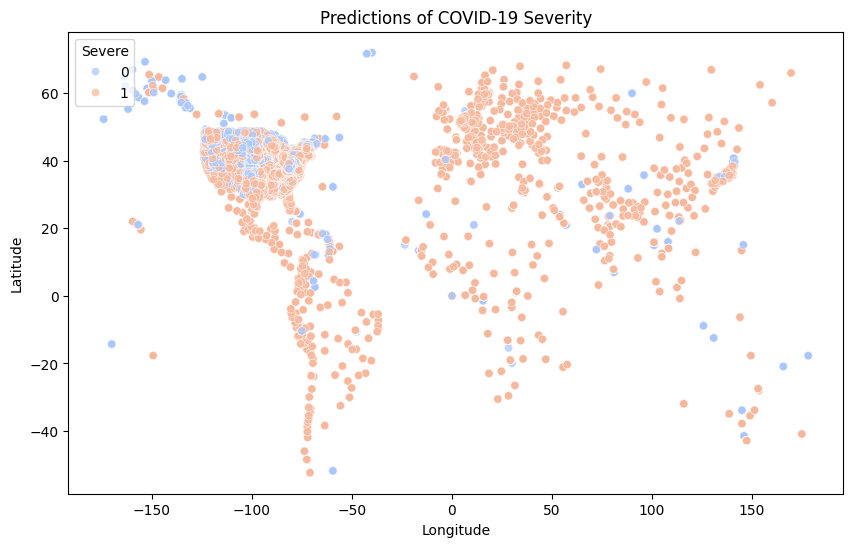

Classification Report:
              precision    recall  f1-score   support

           0       0.81      0.79      0.80     48401
           1       0.82      0.83      0.82     54755

    accuracy                           0.81    103156
   macro avg       0.81      0.81      0.81    103156
weighted avg       0.81      0.81      0.81    103156

Accuracy: 0.8114990887587731


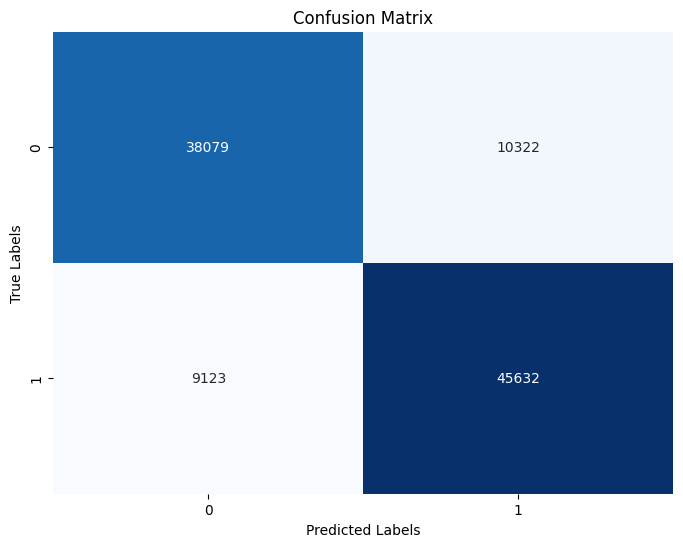

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Visualize predictions on a map
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Longitude', y='Latitude', hue='Severe', data=covid_df, palette='coolwarm', alpha=0.7)
plt.title('Predictions of COVID-19 Severity')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.legend(title='Severe', loc='upper left')
plt.show()

# Evaluate performance using classification report and accuracy score
print("Classification Report:")
print(classification_report(y_test, pred))

accuracy = accuracy_score(y_test, pred)
print("Accuracy:", accuracy)

# Confusion matrix
conf_matrix = confusion_matrix(y_test, pred)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap="Blues", cbar=False)
plt.title("Confusion Matrix")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

TF-ID **vectorization**

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score

# Assuming you have a 'tweets' DataFrame containing text data
tweets_df = tweets

# Drop rows with missing values in the 'text' column
tweets_df = tweets_df.dropna(subset=['text'])

# Select the text feature
text_data = tweets_df['text']

# Initialize the TF-IDF vectorizer
tfidf_vectorizer = TfidfVectorizer(max_features=1000)  # You can adjust max_features as needed

# Fit and transform the text data
X_text = tfidf_vectorizer.fit_transform(text_data)
# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Combine text features with existing features
X_combined = X_text
# Initialize the KNN classifier
knn = KNeighborsClassifier(n_neighbors=7)

# Train the classifier
knn.fit(X_train, y_train)

# Predict the response
pred = knn.predict(X_test)

# Evaluate the model
print("Accuracy:", accuracy_score(y_test, pred))
print("\nClassification Report:")
print(classification_report(y_test, pred))


Accuracy: 0.9459459459459459

Classification Report:
              precision    recall  f1-score   support

           0       0.94      1.00      0.97        33
           1       1.00      0.50      0.67         4

    accuracy                           0.95        37
   macro avg       0.97      0.75      0.82        37
weighted avg       0.95      0.95      0.94        37



### **SVM**

In [ ]:
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score

# Load your dataset - replace 'file_path' with the actual path to your csv file
covid_df = data1.copy()  # Make a copy of the DataFrame to avoid modifying the original

covid_df =covid_df.dropna(subset=['Latitude', 'Longitude', 'Confirmed'])

# Define a threshold for severity
threshold = 50

# Create a new binary column 'Severe' based on a threshold of confirmed cases
covid_df['Severe'] = (covid_df['Confirmed'] > threshold).astype(int)

# Select the features and the target
X = covid_df[['Latitude', 'Longitude']]  # You might want to include more features here
y = covid_df['Severe']

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize and train the SVM classifier
svm_classifier = SVC(kernel="linear")
svm_classifier.fit(X_train, y_train)

# Predict the response
pred = svm_classifier.predict(X_test)

# Evaluate the model
print("Accuracy:", accuracy_score(y_test, pred))
print("\nClassification Report:")
print(classification_report(y_test, pred))

Accuracy: 0.8918918918918919

Classification Report:
              precision    recall  f1-score   support

           0       0.89      1.00      0.94        33
           1       0.00      0.00      0.00         4

    accuracy                           0.89        37
   macro avg       0.45      0.50      0.47        37
weighted avg       0.80      0.89      0.84        37



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


<ipython-input-9-2cd9acd9c3ae>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  covid_df['Severe'] = (covid_df['Confirmed'] > threshold).astype(int)
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_st

Accuracy: 0.8918918918918919

Classification Report:
              precision    recall  f1-score   support

           0       0.89      1.00      0.94        33
           1       0.00      0.00      0.00         4

    accuracy                           0.89        37
   macro avg       0.45      0.50      0.47        37
weighted avg       0.80      0.89      0.84        37



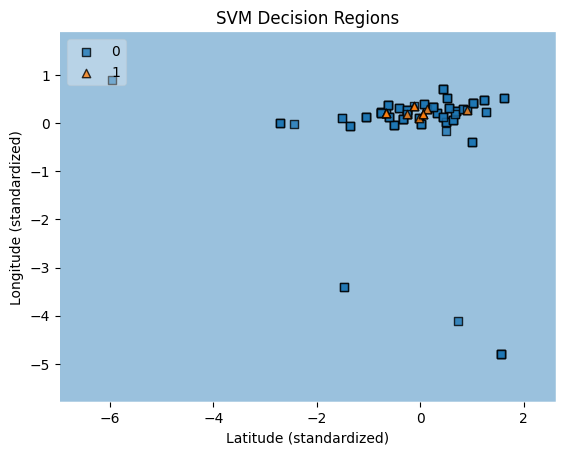

In [ ]:
import matplotlib.pyplot as plt
from mlxtend.plotting import plot_decision_regions
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score
# Load your dataset - replace 'file_path' with the actual path to your csv file
covid_df = data1

# Drop rows with missing values in the 'Latitude', 'Longitude', and 'Confirmed' columns
covid_df = covid_df.dropna(subset=['Latitude', 'Longitude', 'Confirmed'])

# Create a new binary column 'Severe' based on a threshold of confirmed cases
threshold = 50
covid_df['Severe'] = (covid_df['Confirmed'] > threshold).astype(int)

# Select the features and the target
X = covid_df[['Latitude', 'Longitude']]
y = covid_df['Severe']

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the features
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Create a classifier with a linear kernel
svm_classifier = SVC(kernel="linear")

# Train the model
svm_classifier.fit(X_train, y_train)

# Predict the response
pred = svm_classifier.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, pred)
report = classification_report(y_test, pred)

# Print the results
print("Accuracy:", accuracy)
print("\nClassification Report:")
print(report)

# Plot decision regions
plot_decision_regions(X_train, y_train.values, clf=svm_classifier, legend=2)
plt.xlabel('Latitude (standardized)')
plt.ylabel('Longitude (standardized)')
plt.title('SVM Decision Regions')
plt.show()

### **Arjun**

### **Recommender System 1**

In [ ]:
import pandas as pd
import numpy as np
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.preprocessing import StandardScaler

tweets_df = pd.read_csv('covid19tweets-200.csv', low_memory=False)

# Fill NaN values in 'user_verified' with 0 (assuming NaN means not verified)
tweets_df['user_verified'].fillna(0, inplace=True)

tweets_df['user_verified'] = tweets_df['user_verified'].astype(int)

user_profiles = tweets_df[['user_name', 'user_location', 'user_followers', 'user_friends', 'user_verified']].drop_duplicates(subset='user_name')

location_vectorizer = CountVectorizer(token_pattern=r"(?u)\b\w+\b")
location_matrix = location_vectorizer.fit_transform(user_profiles['user_location'].astype(str))

scaler = StandardScaler()
numerical_features = scaler.fit_transform(user_profiles[['user_followers', 'user_friends', 'user_verified']])

combined_features = np.hstack((numerical_features, location_matrix.toarray()))
# Replace NaN values with 0
combined_features = np.nan_to_num(combined_features)



cosine_sim_matrix = cosine_similarity(combined_features)

user_ids = user_profiles['user_name']
cosine_sim_df = pd.DataFrame(cosine_sim_matrix, index=user_ids, columns=user_ids)

def get_similar_users(user_name, cosine_sim_df, number_of_users=3):
    if user_name not in cosine_sim_df.index:
        return 'User not found.'
    else:

        sim_values = cosine_sim_df.loc[user_name]
        most_similar_users = sim_values.sort_values(ascending=False).iloc[1:number_of_users+1].index.tolist()
        return most_similar_users

example_user_name = user_profiles['user_name'].iloc[0]
similar_users = get_similar_users(example_user_name, cosine_sim_df)
print(f"Users similar to '{example_user_name}': {similar_users}")

### **Recommender System 2**

In [ ]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.preprocessing import StandardScaler
import re
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer

# Load the data (Assuming you have a tweets DataFrame named tweets_df and a COVID-19 case DataFrame named covid_df)
tweets_df = pd.read_csv('covid19tweets-200.csv', low_memory=False)  # Update with your path
covid_df = pd.read_csv('covid19cases.csv')    # Update with your path

# Check for NaN values
nan_values = tweets_df['user_verified'].isnull().sum()
print("Number of NaN values in 'user_verified' column:", nan_values)

# Drop NaN values
tweets_df.dropna(subset=['user_verified'], inplace=True)

# Recheck for NaN values
nan_values_after = tweets_df['user_verified'].isnull().sum()
print("Number of NaN values after handling:", nan_values_after)

# Preprocess tweet texts (this is a placeholder - you'll need actual preprocessing steps here)
stop_words = set(stopwords.words('english'))
lemmatizer = WordNetLemmatizer()

def preprocess_text(text):
    # Remove special characters and numbers
    text = re.sub(r'\W', ' ', text)
    text = re.sub(r'\d+', ' ', text)
    # Tokenize the text
    tokens = word_tokenize(text)
    # Remove stopwords and single-character tokens
    tokens = [token for token in tokens if token not in stop_words and len(token) > 1]
    # Lemmatize tokens
    tokens = [lemmatizer.lemmatize(token) for token in tokens]
    return ' '.join(tokens)

# Preprocess tweet texts
tweets_df['text_processed'] = tweets_df['text'].apply(lambda x: preprocess_text(x))

tweets_df['text_processed'] = tweets_df['text'].str.lower()

# Create TF-IDF features for tweet text
tfidf_vectorizer = TfidfVectorizer(max_df=0.95, min_df=2, stop_words='english')
tfidf = tfidf_vectorizer.fit_transform(tweets_df['text_processed'])

# Perform LDA for topic modeling
n_topics = 10  # Choose the number of topics
lda = LatentDirichletAllocation(n_components=n_topics, random_state=0)
topics = lda.fit_transform(tfidf)

# Get the dominant topic for each tweet
tweets_df['dominant_topic'] = topics.argmax(axis=1)

# Scale numerical features
scaler = StandardScaler()
covid_df[['Confirmed', 'Recovered', 'Deaths']] = scaler.fit_transform(covid_df[['Confirmed', 'Recovered', 'Deaths']])

# Analyze the COVID situation, e.g., if cases are increasing, etc.
# This is a placeholder for an actual analysis
def analyze_covid_situation(current_stats):
    threshold = 1000  # Define your threshold value here
    increasing_cases = current_stats['Confirmed'].iloc[0] > threshold
    return increasing_cases

# Based on the COVID situation, filter tweets that are relevant
# This is a placeholder for an actual filtering method
def filter_tweets_by_topic(tweets_df, dominant_topic):
    relevant_tweets = tweets_df[tweets_df['dominant_topic'] == dominant_topic]
    return relevant_tweets

# Recommender Function
def recommend_tweets(location, date, tweets_df, covid_df, n_recommendations=5):
    # Filter COVID data for the location and date
    current_stats = covid_df[(covid_df['Country/Region'] == location) & (covid_df['Date'] == date)]

    # Check if current_stats DataFrame is empty
    if current_stats.empty:
        return "No COVID data available for the specified location and date"

    # Analyze the COVID situation
    increasing_cases = analyze_covid_situation(current_stats)

    if increasing_cases:
        # Determine the dominant topic related to increasing COVID cases
        dominant_topic = tweets_df.groupby('dominant_topic').size().idxmax()
        relevant_tweets = filter_tweets_by_topic(tweets_df, dominant_topic)
    else:
        relevant_tweets = tweets_df  # Or whichever logic you want for non-increasing cases

    # Recommend top N tweets based on relevance
    recommend_tweets = relevant_tweets['text'].head(n_recommendations).tolist()
    return recommend_tweets

# Example usage:
location = 'China'
date = '2020-01-22'  # Example date, format should match your dataset
recommended_tweets = recommend_tweets(location, date, tweets_df, covid_df)
print(recommended_tweets)

### **Recommender System 3**

In [ ]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer

# Load the data (Assuming you have COVID tweets DataFrame named tweets_df and COVID cases DataFrame named covid_df)
tweets_df = pd.read_csv('covid19tweets-200.csv', low_memory=False)  # Update with your path
covid_df = pd.read_csv('covid19cases.csv')  # Update with your path

# Drop rows with missing 'text' values
tweets_df = tweets_df.dropna(subset=['text'])

# Content-based filtering: TF-IDF for tweet text
tfidf_vectorizer = TfidfVectorizer(stop_words='english')
tfidf_matrix = tfidf_vectorizer.fit_transform(tweets_df['text'])

# Define the threshold value
threshold = 1000  # Example threshold value, adjust as needed

# Define a function to recommend tweets based on COVID-19 cases
def recommend_tweets_based_on_cases(location, date, tweets_df, covid_df, n_recommendations=5):
    # Filter tweets related to COVID-19
    covid_related_tweets = tweets_df[tweets_df['text'].str.contains('covid|coronavirus', case=False)]

    # Filter COVID data for the location and date
    current_stats = covid_df[(covid_df['Country/Region'] == location) & (covid_df['Date'] == date)]

    # Analyze the COVID situation
    # This is a placeholder for an actual analysis
    increasing_cases = current_stats['Confirmed'].iloc[0] > threshold

    # Recommend top N tweets based on relevance to COVID-19
    if increasing_cases:
        relevant_tweets = covid_related_tweets.head(n_recommendations)
    else:
        relevant_tweets = covid_related_tweets.sample(n=n_recommendations)

    return relevant_tweets['text'].tolist()

# Hybrid recommender function
#def hybrid_recommend_tweets(location, date, tweets_df, covid_df, n_recommendations=5):
#    case_related_tweets = recommend_tweets_based_on_cases(location, date, tweets_df, covid_df, n_recommendations)

#    return case_related_tweets

# Example usage:
location = 'India'
date = '2020-05-01'
recommended_tweets = recommend_tweets_based_on_cases(location, date, tweets_df, covid_df) #hybrid_recommend_tweets(location, date, tweets_df, covid_df)
print(recommended_tweets)

### **Piyusha**

### **Emotional Arc Analysis**
NRCLex will measure emotional affect from a body of text

In [ ]:
!pip install nrclex

INFO: pip is looking at multiple versions of nrclex to determine which version is compatible with other requirements. This could take a while.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 396.4/396.4 kB 9.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for nrclex: filename=NRCLex-3.0.0-py3-none-any.whl size=43309 sha256=92fcbb2adcf26ce89eda8146412cf7d9c2a61ea3484f5b92fd93cbd208cda6ed
  Stored in directory: /root/.cache/pip/wheels/d2/10/44/6abfb1234298806a145fd6bcaec8cbc712e88dd1cd6cb242fa
Successfully built nrclex


In [ ]:
import nltk
nltk.download('punkt')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


True

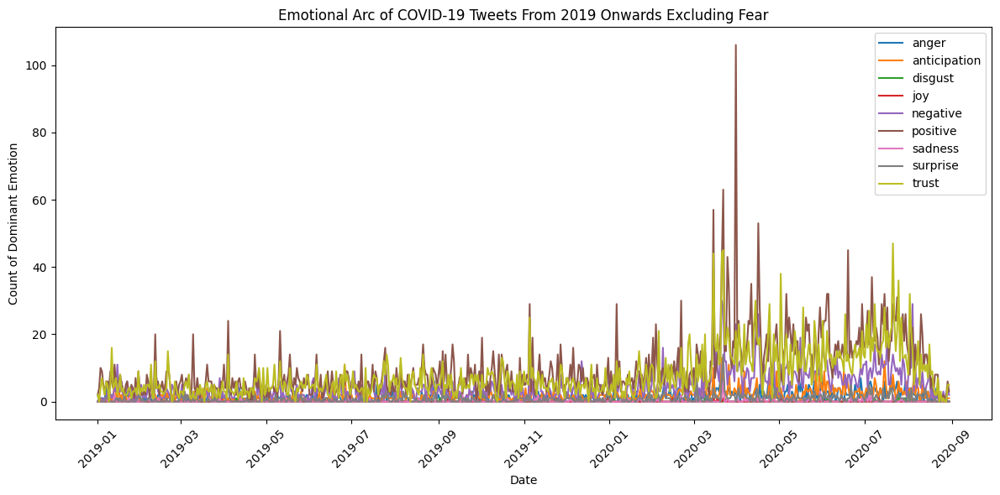

In [ ]:
import pandas as pd
from nrclex import NRCLex
import matplotlib.pyplot as plt

tweets_df = tweets.copy()
tweets_df['created_at'] = pd.to_datetime(tweets_df['user_created'])

def get_dominant_emotion(text):
    emotions = NRCLex(text).affect_frequencies
    dominant_emotion = max(emotions, key=emotions.get)
    return dominant_emotion

tweets_df['dominant_emotion'] = tweets_df['text'].apply(get_dominant_emotion)
emotion_counts_over_time = tweets_df.groupby([tweets_df['created_at'].dt.date, 'dominant_emotion']).size().unstack(fill_value=0)
emotion_counts_over_time.index = pd.to_datetime(emotion_counts_over_time.index)

# Filter data for dates from 2019 onwards
emotion_counts_over_time_filtered = emotion_counts_over_time[emotion_counts_over_time.index.year >= 2019]

emotion_counts_over_time_filtered = emotion_counts_over_time_filtered.drop(columns=['fear'], errors='ignore')

plt.figure(figsize=(12, 6))
for emotion in emotion_counts_over_time_filtered.columns:
    plt.plot(emotion_counts_over_time_filtered.index, emotion_counts_over_time_filtered[emotion], label=emotion)

plt.title('Emotional Arc of COVID-19 Tweets From 2019 Onwards Excluding Fear')
plt.xlabel('Date')
plt.ylabel('Count of Dominant Emotion')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

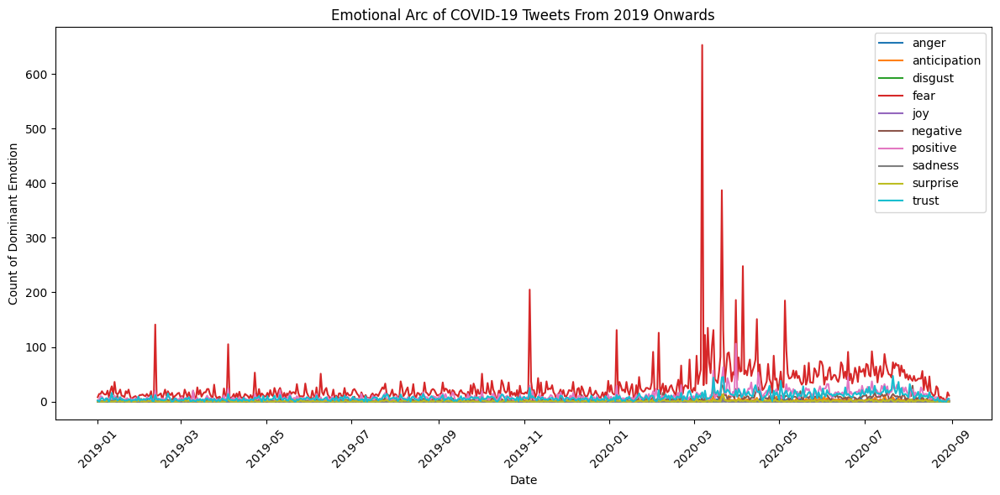

In [ ]:
#Emotional Arc Analysis
import pandas as pd
from nrclex import NRCLex
import matplotlib.pyplot as plt

tweets_df = tweets.copy()

tweets_df['created_at'] = pd.to_datetime(tweets_df['user_created'])

def get_dominant_emotion(text):
    emotions = NRCLex(text).affect_frequencies
    dominant_emotion = max(emotions, key=emotions.get)
    return dominant_emotion

tweets_df['dominant_emotion'] = tweets_df['text'].apply(get_dominant_emotion)

emotion_counts_over_time = tweets_df.groupby([tweets_df['created_at'].dt.date, 'dominant_emotion']).size().unstack(fill_value=0)
emotion_counts_over_time.index = pd.to_datetime(emotion_counts_over_time.index)

emotion_counts_over_time_filtered = emotion_counts_over_time[emotion_counts_over_time.index.year >= 2019]

# Plot the graph to analyze the dominant emotions
plt.figure(figsize=(12, 6))

for emotion in emotion_counts_over_time_filtered.columns:
    plt.plot(emotion_counts_over_time_filtered.index, emotion_counts_over_time_filtered[emotion], label=emotion)

plt.title('Emotional Arc of COVID-19 Tweets From 2019 Onwards')
plt.xlabel('Date')
plt.ylabel('Count of Dominant Emotion')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

**Cohort Analysis**

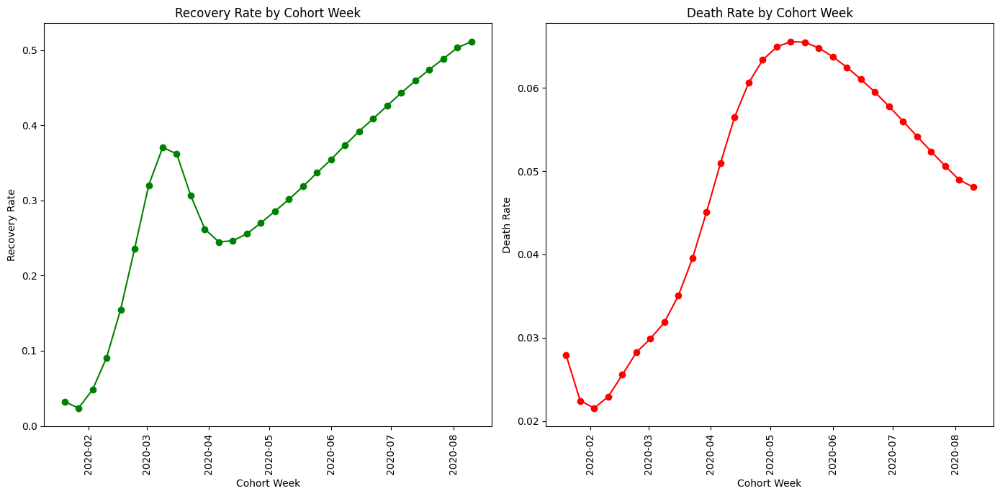

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

data_copy = data.copy()

data_copy['Date'] = pd.to_datetime(data_copy['Date'])

data_copy['cohort_week'] = data_copy['Date'].dt.to_period('W').apply(lambda r: r.start_time)

cohort_data = data_copy.groupby('cohort_week').agg(
    Confirmed=('Confirmed', 'sum'),
    Recovered=('Recovered', 'sum'),
    Deaths=('Deaths', 'sum')
).cumsum()

cohort_data['Recovery Rate'] = cohort_data['Recovered'] / cohort_data['Confirmed']
cohort_data['Death Rate'] = cohort_data['Deaths'] / cohort_data['Confirmed']

cohort_data.fillna(0, inplace=True)


plt.figure(figsize=(14, 7))

# Recovery Rate
plt.subplot(1, 2, 1)
plt.plot(cohort_data.index, cohort_data['Recovery Rate'], marker='o', linestyle='-', color='green')
plt.title('Recovery Rate by Cohort Week')
plt.xlabel('Cohort Week')
plt.ylabel('Recovery Rate')
plt.xticks(rotation=90)

# Death Rate
plt.subplot(1, 2, 2)
plt.plot(cohort_data.index, cohort_data['Death Rate'], marker='o', linestyle='-', color='red')
plt.title('Death Rate by Cohort Week')
plt.xlabel('Cohort Week')
plt.ylabel('Death Rate')
plt.xticks(rotation=90)

plt.tight_layout()
plt.show()

### **Growth Factor Analysis**

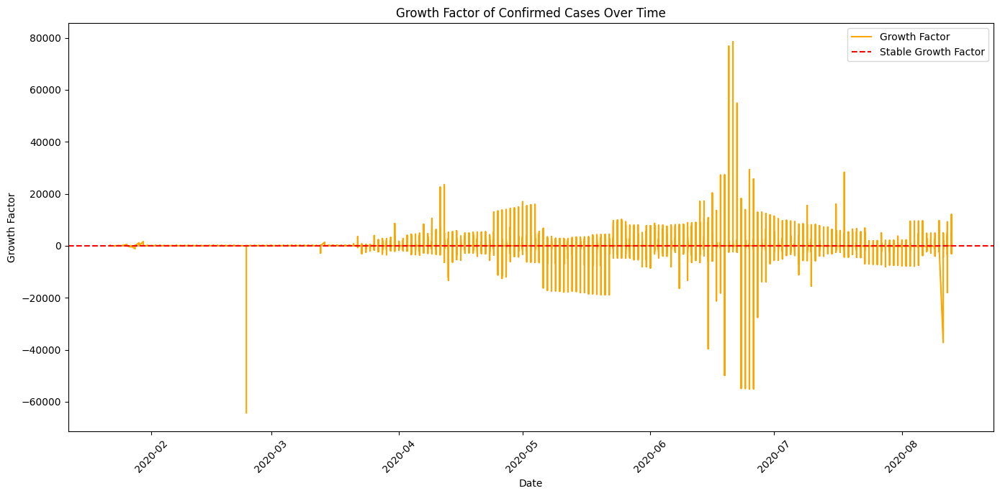

In [ ]:
data_copy['New Confirmed'] = data_copy['Confirmed'].diff().fillna(0)
data_copy['Growth Factor'] = data_copy['New Confirmed'].div(data_copy['New Confirmed'].shift(1)).replace(np.inf, np.nan).fillna(0)

plt.figure(figsize=(14, 7))
plt.plot(data_copy['Date'], data_copy['Growth Factor'], label='Growth Factor', color='orange')
plt.title('Growth Factor of Confirmed Cases Over Time')
plt.axhline(y=1, linestyle='--', color='red', label='Stable Growth Factor')
plt.xlabel('Date')
plt.ylabel('Growth Factor')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

### **Rate of Increase Analysis**

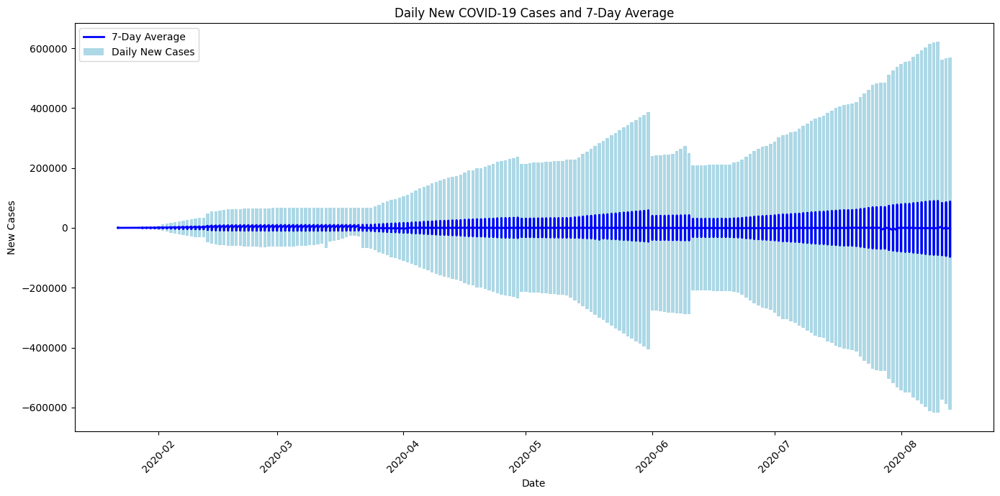

In [ ]:
data_copy['Daily New Cases'] = data_copy['Confirmed'].diff().fillna(0)
data_copy['7-Day Average'] = data_copy['Daily New Cases'].rolling(window=7).mean()

plt.figure(figsize=(14, 7))
plt.bar(data_copy['Date'], data_copy['Daily New Cases'], label='Daily New Cases', color='lightblue')
plt.plot(data_copy['Date'], data_copy['7-Day Average'], label='7-Day Average', color='blue', linewidth=2)
plt.title('Daily New COVID-19 Cases and 7-Day Average')
plt.xlabel('Date')
plt.ylabel('New Cases')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

### **Geospatial Analysis**

In [ ]:
import folium
from folium.plugins import HeatMap

# Generate a base map
map_base = folium.Map([0, 0], zoom_start=2)

heat_data = [
    [row['Latitude'], row['Longitude']]
    for index, row in data_copy.dropna(subset=['Latitude', 'Longitude']).iterrows()
]

map_base = folium.Map([0, 0], zoom_start=2)

# Create a heatmap layer
HeatMap(heat_data).add_to(map_base)

# Display the map
map_base

### **Geographical Dataframe created**

In [ ]:
# The geographical data is loaded from the drive and a new dataframe is created
base_path = '/content/drive/My Drive/IS688_PiyushaSayal/'

worldcities = pd.read_csv(base_path + 'worldcitiespop.csv',
                          usecols=['Country', 'City', 'AccentCity', 'Region',
                                   'Population', 'Latitude', 'Longitude'],
                          dtype={'Country': str, 'City': str, 'AccentCity': str,
                                 'Region': str, 'Population': float,
                                 'Latitude': float, 'Longitude': float})


In [ ]:
worldcities.head(5)

,Country,City,AccentCity,Region,Population,Latitude,Longitude
0,ad,aixas,Aixàs,06,NaN,42.483333,1.466667
1,ad,aixirivali,Aixirivali,06,NaN,42.466667,1.500000
2,ad,aixirivall,Aixirivall,06,NaN,42.466667,1.500000
3,ad,aixirvall,Aixirvall,06,NaN,42.466667,1.500000
4,ad,aixovall,Aixovall,06,NaN,42.466667,1.483333


### **Cases reported over time**

<ipython-input-16-29b9a61c6722>:26: FutureWarning: 'any' with datetime64 dtypes is deprecated and will raise in a future version. Use (obj != pd.Timestamp(0)).any() instead.
  if group_data[group_data['Date'] == latest_date].any().any():
<ipython-input-16-29b9a61c6722>:26: FutureWarning: 'any' with datetime64 dtypes is deprecated and will raise in a future version. Use (obj != pd.Timestamp(0)).any() instead.
  if group_data[group_data['Date'] == latest_date].any().any():
<ipython-input-16-29b9a61c6722>:26: FutureWarning: 'any' with datetime64 dtypes is deprecated and will raise in a future version. Use (obj != pd.Timestamp(0)).any() instead.
  if group_data[group_data['Date'] == latest_date].any().any():


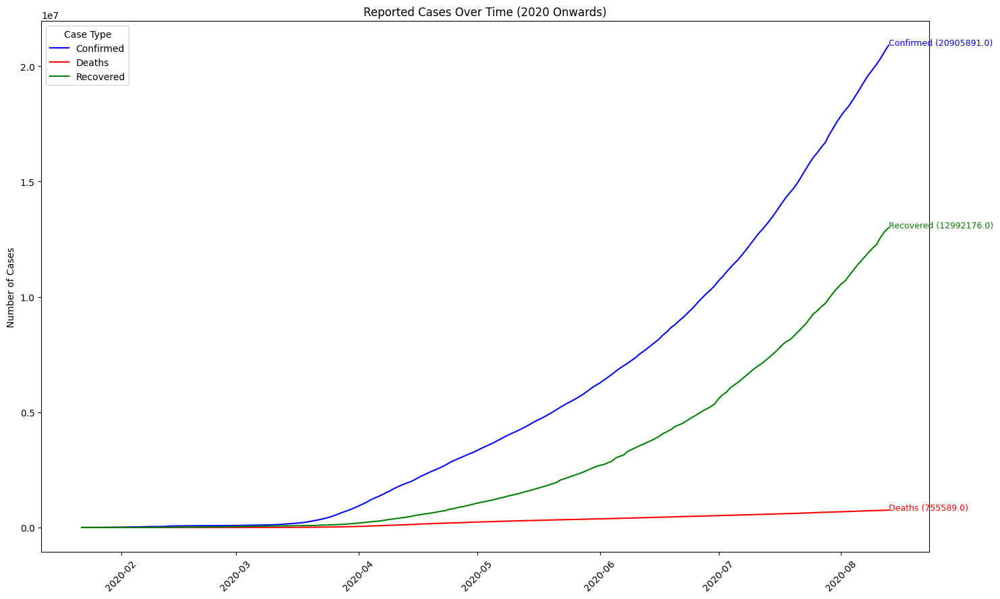

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# The dataframe is transformed
selected_columns = data[['Date', 'Confirmed', 'Recovered', 'Deaths']]
melted_data = selected_columns.melt(id_vars=['Date'], var_name='group_var', value_name='Cases')
dropped_na = melted_data.dropna(subset=['Cases'])
grouped_data = dropped_na.groupby(['Date', 'group_var'], as_index=False).agg(n=('Cases', 'sum'))
tidy_data = grouped_data

# The latest date in the dataset
latest_date = tidy_data['Date'].max()

# Adding labels for the latest date
tidy_data['label'] = tidy_data.apply(lambda x: x['group_var'] if x['Date'] == latest_date else '', axis=1)

color_mapping = {'Confirmed': 'blue', 'Recovered': 'green', 'Deaths': 'red'}

# Plot the graph
plt.figure(figsize=(15, 9))
for group in tidy_data['group_var'].unique():
    group_data = tidy_data[tidy_data['group_var'] == group]
    plt.plot(group_data['Date'], group_data['n'], label=group, color=color_mapping[group])

    # Add labels to the latest point of each line if desired
    if group_data[group_data['Date'] == latest_date].any().any():
        latest_value = group_data[group_data['Date'] == latest_date]['n'].values[0]
        plt.text(latest_date, latest_value, f"{group} ({latest_value})", fontsize=9, color=color_mapping[group])

# Customize the plot
plt.title('Reported Cases Over Time (2020 Onwards)')
plt.xlabel('')
plt.ylabel('Number of Cases')
plt.legend(title='Case Type')
plt.xticks(rotation=45)
plt.tight_layout()

# Show the plot
plt.show()

### **Top 5 countries per case type**

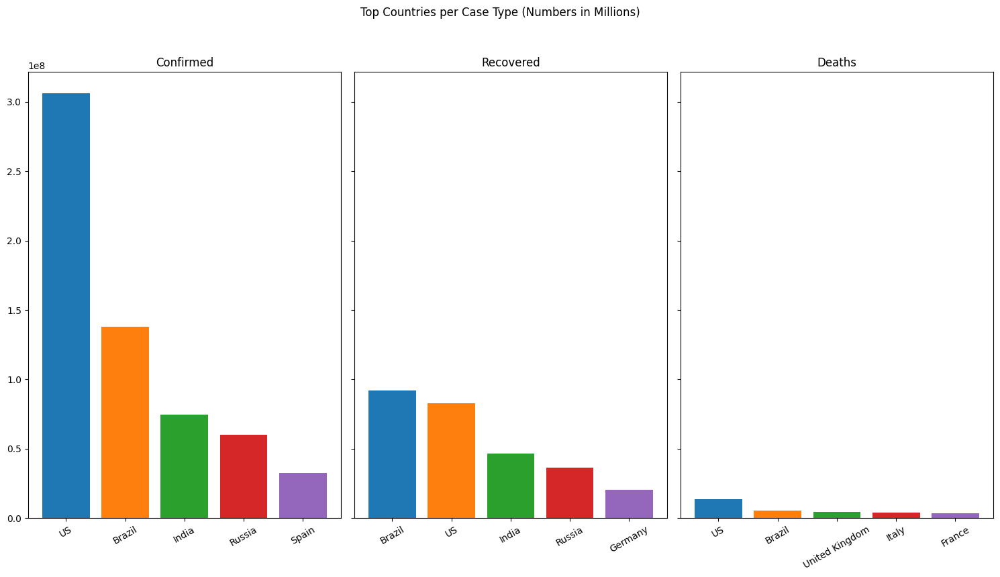

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

my_colors = [
    '#1f77b4',
    '#ff7f0e',
    '#2ca02c',
    '#d62728',
    '#9467bd'  ]

# Data transformation
selected_columns = data[['Country', 'Confirmed', 'Recovered', 'Deaths']]
melted_data = selected_columns.melt(id_vars=['Country'], var_name='group_var', value_name='Cases')

# Group by 'Country' and 'group_var' and sum the cases
grouped_sum = melted_data.groupby(['Country', 'group_var'], as_index=False).agg(n=('Cases', 'sum'))
sorted_data = grouped_sum.sort_values(by='n', ascending=False)
top_countries_by_case = sorted_data.groupby('group_var').head(5)

# Plot the graph
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(15, 9), sharey=True)
case_types = top_countries_by_case['group_var'].unique()

# Plot each case type in a separate subplot
for ax, (index, case_type) in zip(axes, enumerate(case_types)):
    case_data = top_countries_by_case[top_countries_by_case['group_var'] == case_type].sort_values(by='n', ascending=False)
    colors = my_colors[:len(case_data)]
    bars = ax.bar(case_data['Country'], case_data['n'], color=colors)

    for bar in bars:
        height = bar.get_height()
        ax.annotate(f'{round(height/1000000, 1)}M',
                    xy=(bar.get_x() + bar.get_width() / 2, height),
                    xytext=(0, 3),
                    textcoords="offset points",
                    ha='center', va='bottom', color='white', size=10)

    # Set the title for the subplot
    ax.set_title(case_type)

    # Rotate x-axis labels for better readability
    ax.tick_params(axis='x', rotation=30)

plt.suptitle('Top Countries per Case Type (Numbers in Millions)')
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()


### **Text Preparation**

In [ ]:
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import string

nltk.download('punkt')
nltk.download('stopwords')

def clean_corpus(text):
    # Tokenization
    words = word_tokenize(text)

    # Convert to lowercase and remove punctuation and numbers
    words = [word.lower() for word in words if word.isalpha()]

    # Prepare a list of stopwords
    stop_words = set(stopwords.words('english'))
    additional_stopwords = {"thats", "weve", "hes", "theres", "ive", "im",
                            "will", "can", "cant", "dont", "youve", "us",
                            "youre", "youll", "theyre", "whats", "didnt"}
    all_stopwords = stop_words.union(additional_stopwords)

    # Remove stopwords
    words = [word for word in words if word not in all_stopwords]

    # Return the cleaned list of words
    return ' '.join(words)

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


### **Finding frequent Unigrams, Bigrams, Trigrams**

In [ ]:
import nltk
from nltk import bigrams, trigrams
from nltk.probability import FreqDist
from sklearn.feature_extraction.text import CountVectorizer
import pandas as pd

nltk.download('punkt')
nltk.download('stopwords')


# Unigram Frequency Function
def frequent_terms(texts):
    vectorizer = CountVectorizer(stop_words='english')
    x = vectorizer.fit_transform(texts)
    freqs = zip(vectorizer.get_feature_names_out(), x.sum(axis=0).tolist()[0])
    word_freqs = sorted(freqs, key=lambda x: x[1], reverse=True)
    df = pd.DataFrame(word_freqs, columns=['word', 'freq'])
    return df[df['freq'] > 1]

# Bigram Frequency Function
def frequent_bigrams(texts):
    vectorizer = CountVectorizer(ngram_range=(2, 2), stop_words='english')
    x = vectorizer.fit_transform(texts)
    freqs = zip(vectorizer.get_feature_names_out(), x.sum(axis=0).tolist()[0])
    word_freqs = sorted(freqs, key=lambda x: x[1], reverse=True)
    df = pd.DataFrame(word_freqs, columns=['word', 'freq'])
    return df[df['freq'] > 1]

# Trigram Frequency Function
def frequent_trigrams(texts):
    vectorizer = CountVectorizer(ngram_range=(3, 3), stop_words='english')
    x = vectorizer.fit_transform(texts)
    freqs = zip(vectorizer.get_feature_names_out(), x.sum(axis=0).tolist()[0])
    word_freqs = sorted(freqs, key=lambda x: x[1], reverse=True)
    df = pd.DataFrame(word_freqs, columns=['word', 'freq'])
    return df[df['freq'] > 1]

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


### **Download proper lexicon files**

In [ ]:
import pandas as pd

afinn_file_path = '/content/drive/My Drive/IS688_PiyushaSayal/Afinn.csv'
bing_file_path = '/content/drive/My Drive/IS688_PiyushaSayal/Bing.csv'
nrc_file_path = '/content/drive/My Drive/IS688_PiyushaSayal/NRC.csv'

# Read in the CSV files
afinn = pd.read_csv(afinn_file_path, dtype={'word': str, 'value': float}, encoding='latin1')
bing = pd.read_csv(bing_file_path, dtype={'word': str, 'sentiment': str}, encoding='latin1')
nrc = pd.read_csv(nrc_file_path, dtype={'word': str, 'sentiment': str}, encoding='latin1')

# Display the first few rows of the dataframes to confirm
print(afinn.head())
print(bing.head())
print(nrc.head())

        word  value
0    abandon   -2.0
1  abandoned   -2.0
2   abandons   -2.0
3   abducted   -2.0
4  abduction   -2.0
         word sentiment
0     2-faces  negative
1    abnormal  negative
2     abolish  negative
3  abominable  negative
4  abominably  negative
        word sentiment
0     abacus     trust
1    abandon      fear
2    abandon  negative
3    abandon   sadness
4  abandoned     anger


In [ ]:
import pandas as pd

tweets['user_location'] = tweets['user_location'].str.lower()
location_grouped = tweets.groupby('user_location')
location_counts = location_grouped.size()
location_counts_df = location_counts.reset_index(name='n')
tweets_location = location_counts_df.sort_values(by='n', ascending=False)

# Create a new column and fill it with NA
tweets_location['country'] = pd.NA

tweets_location.head()

,user_location,n,country
10292,india,3842,<NA>
23071,united states,2457,<NA>
24904,worldwide,1738,<NA>
15306,"new delhi, india",1731,<NA>
14716,"mumbai, india",1406,<NA>


In [ ]:
import pandas as pd

def assign_country(location):
    location = location.lower()
    if 'india' in location or 'delhi' in location or 'mumbai' in location or \
       'bengaluru' in location or 'bangalore' in location or 'bhubaneswar' in location or \
       'hyderabad' in location:
        return 'India'
    elif 'china' in location or 'beijing' in location:
        return 'China'
    elif 'hong kong' in location:
        return 'Hong Kong'
    elif 'united states' in location or 'usa' in location or 'us' in location or \
         'washington' in location or 'new york' in location or 'angeles' in location or \
         'atlanta' in location or 'california' in location or 'chicago' in location or \
         'boston' in location or 'philadelphia' in location or 'diego' in location or \
         'seattle' in location or 'texas' in location or 'nyc' in location or \
         'vegas' in location or 'francisco' in location or 'florida' in location or \
         'dallas' in location or 'denver' in location:
        return 'US'
    elif 'worldwide' in location or 'global' in location or 'earth' in location or \
         'everywhere' in location:
        return 'NoCountry'
    else:
        return pd.NA  # Use pd.NA for missing values in Pandas

tweets_location['country'] = tweets_location['user_location'].apply(assign_country)

tweets_location.head()

,user_location,n,country
10292,india,3842,India
23071,united states,2457,US
24904,worldwide,1738,NoCountry
15306,"new delhi, india",1731,India
14716,"mumbai, india",1406,India


In [ ]:
# Filter to get US cities and clean up the data
us_cities = worldcities[worldcities['Country'] == "us"].copy()
us_cities['Country'] = "US"
us_cities = us_cities[['Country', 'City', 'AccentCity']]

us_city_set = set(us_cities['City'].str.lower())

tweets_location['flag_us'] = tweets_location['user_location'].str.lower().isin(us_city_set)

In [ ]:
# Perform a left join on the 'user_location' column
tweets = tweets.merge(tweets_location, on='user_location', how='left')
tweets = tweets.drop(columns=['n', 'flag_us'])

In [ ]:
import pandas as pd
import nltk
from nltk.tokenize import word_tokenize

nltk.download('punkt')

tweets['text'] = tweets['text'].astype(str)

# Tokenize the 'text' column
tweets['words'] = tweets['text'].apply(nltk.word_tokenize)

# Explode the 'words' list into separate rows
unnest_tweets = tweets.explode('words').rename(columns={'words': 'word'})

unnest_tweets.head()

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,is_retweet,country,word
0,ᏉᎥ☻լꂅϮ,astroworld,wednesday addams as a disney princess keepin i...,2017-05-26 05:46:42,624.0,950.0,18775.0,False,2020-07-25 12:27:21,If I smelled the scent of hand sanitizers toda...,NaN,Twitter for iPhone,False,<NA>,If
0,ᏉᎥ☻լꂅϮ,astroworld,wednesday addams as a disney princess keepin i...,2017-05-26 05:46:42,624.0,950.0,18775.0,False,2020-07-25 12:27:21,If I smelled the scent of hand sanitizers toda...,NaN,Twitter for iPhone,False,<NA>,I
0,ᏉᎥ☻լꂅϮ,astroworld,wednesday addams as a disney princess keepin i...,2017-05-26 05:46:42,624.0,950.0,18775.0,False,2020-07-25 12:27:21,If I smelled the scent of hand sanitizers toda...,NaN,Twitter for iPhone,False,<NA>,smelled
0,ᏉᎥ☻լꂅϮ,astroworld,wednesday addams as a disney princess keepin i...,2017-05-26 05:46:42,624.0,950.0,18775.0,False,2020-07-25 12:27:21,If I smelled the scent of hand sanitizers toda...,NaN,Twitter for iPhone,False,<NA>,the
0,ᏉᎥ☻լꂅϮ,astroworld,wednesday addams as a disney princess keepin i...,2017-05-26 05:46:42,624.0,950.0,18775.0,False,2020-07-25 12:27:21,If I smelled the scent of hand sanitizers toda...,NaN,Twitter for iPhone,False,<NA>,scent


In [ ]:
import pandas as pd
import nltk
from nltk.corpus import stopwords

nltk.download('stopwords')
custom_stopwords = ["thats", "weve", "hes", "theres", "ive", "im",
                    "will", "can", "cant", "dont", "youve", "us",
                    "youre", "youll", "theyre", "whats", "didnt", "just"]

all_stopwords = stopwords.words('english') + custom_stopwords
stopwords_script = pd.DataFrame({'word': all_stopwords})
stopwords_script.head()

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


,word
0,i
1,me
2,my
3,myself
4,we


### **Number of Tweets in Time**

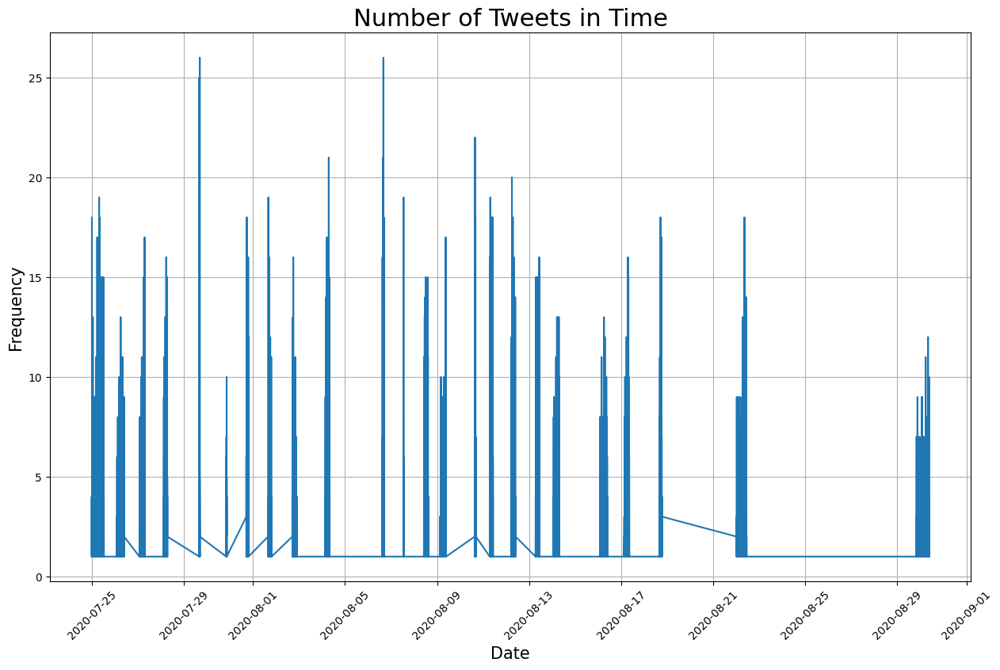

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

tweets['date'] = pd.to_datetime(tweets['date'])
tweets_count = tweets.groupby('date').size().reset_index(name='n')

plt.figure(figsize=(15, 9))
plt.plot(tweets_count['date'], tweets_count['n'], color=my_colors[0], linewidth=1.5)
plt.title('Number of Tweets in Time', fontsize=22)
plt.xlabel('Date', fontsize=15)
plt.ylabel('Frequency', fontsize=15)
plt.xticks(rotation=45)
plt.grid(True)
plt.show()


<ipython-input-33-10477a02b11f>:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='n', y='country', data=tweets_country_count, palette='viridis')


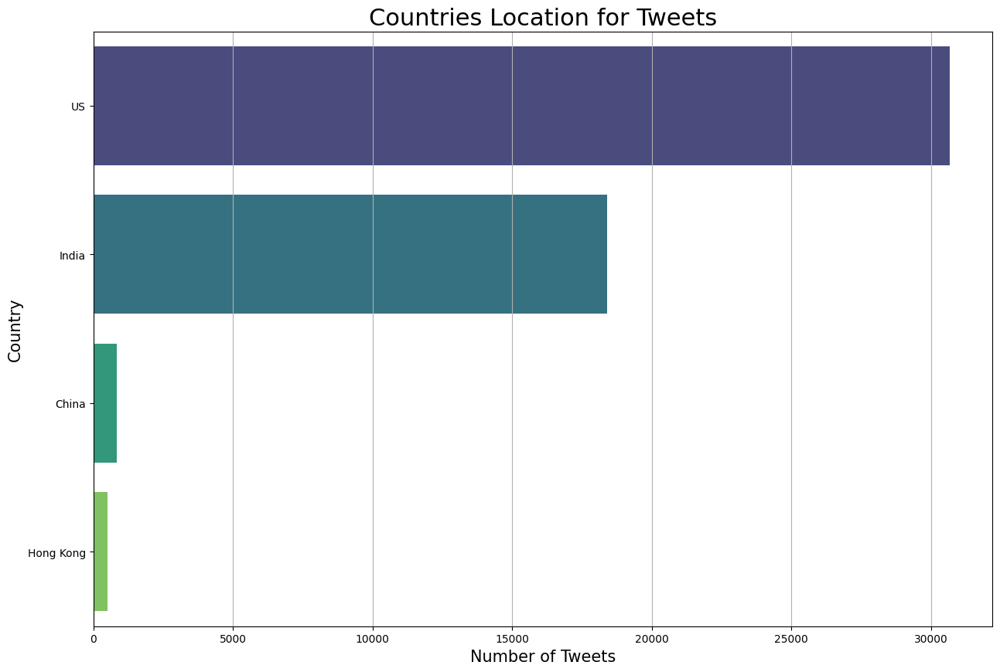

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

tweets_country_count = tweets.groupby('country').size().reset_index(name='n')

# Remove rows with 'NA' in the country column
tweets_country_count = tweets_country_count[~tweets_country_count['country'].isin(['NA', 'NoCountry'])]

# Sorting countries by tweet count
tweets_country_count = tweets_country_count.sort_values(by='n', ascending=False)

# Plotting
plt.figure(figsize=(15, 10))
sns.barplot(x='n', y='country', data=tweets_country_count, palette='viridis')
plt.title('Countries Location for Tweets', fontsize=22)
plt.xlabel('Number of Tweets', fontsize=15)
plt.ylabel('Country', fontsize=15)
plt.grid(True, axis='x')
plt.show()


<ipython-input-34-46344299ce33>:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=tweets_melted, x='group_var', y='Cases', palette=my_colors,
<ipython-input-34-46344299ce33>:13: UserWarning: The palette list has more values (5) than needed (3), which may not be intended.
  sns.boxplot(data=tweets_melted, x='group_var', y='Cases', palette=my_colors,


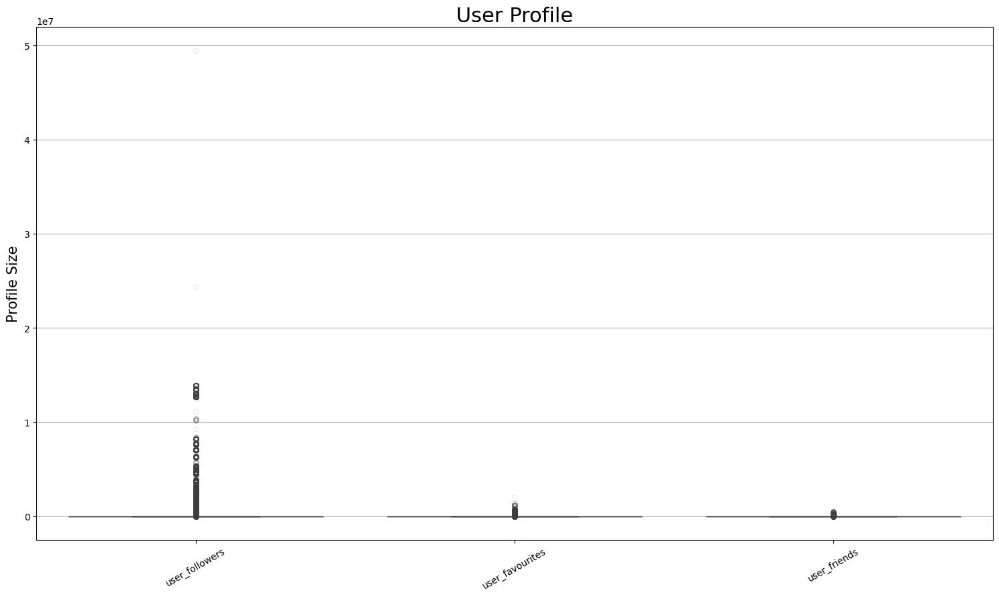

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

tweets_melted = pd.melt(tweets[['user_followers', 'user_favourites', 'user_friends']],
                        var_name='group_var', value_name='Cases', ignore_index=False)

# Plotting
plt.figure(figsize=(15, 9))
sns.boxplot(data=tweets_melted, x='group_var', y='Cases', palette=my_colors,
            flierprops=dict(marker='o', markersize=5, alpha=0.1))
plt.ylabel('Profile Size', fontsize=15)
plt.xlabel('')
plt.title('User Profile', fontsize=22)
plt.xticks(rotation=30)
plt.grid(axis='y')
plt.tight_layout()
plt.show()


### **Topic Modelling** (Vybhavi)

In [ ]:
pip install numpy pandas matplotlib nltk gensim pyldavis

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.6/2.6 MB 11.0 MB/s eta 0:00:00


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from nltk.corpus import stopwords
from nltk.tokenize import RegexpTokenizer
from gensim import corpora, models
import pyLDAvis.gensim_models
import nltk

# Ensure you have the necessary NLTK data
nltk.download('stopwords')

tweets_df=tweets.copy()

# Text preprocessing
tokenizer = RegexpTokenizer(r'\w+')
en_stop = set(stopwords.words('english'))

def preprocess(text):
    raw = text.lower()
    tokens = tokenizer.tokenize(raw)
    stopped_tokens = [i for i in tokens if not i in en_stop]
    return stopped_tokens

# Applying the preprocessing to the tweet texts
tweets_df['cleaned'] = tweets_df['text'].apply(preprocess)

# Creating the term dictionary of our corpus, where every unique term is assigned an index
dictionary = corpora.Dictionary(tweets_df['cleaned'])

# Converting list of documents (corpus) into Document Term Matrix using dictionary prepared above
doc_term_matrix = [dictionary.doc2bow(doc) for doc in tweets_df['cleaned']]

# Creating the LDA model
ldamodel = models.LdaModel(doc_term_matrix, num_topics=3, id2word = dictionary, passes=50)

# Print the topics identified by LDA model
ldamodel.print_topics(num_topics=3, num_words=5)

# Visualize the topics for interpretability
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim_models.prepare(ldamodel, doc_term_matrix, dictionary)
pyLDAvis.display(vis)


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


### **Mental Health Impact**

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.

<ipython-input-103-bcbaf4cc8c17>:23: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



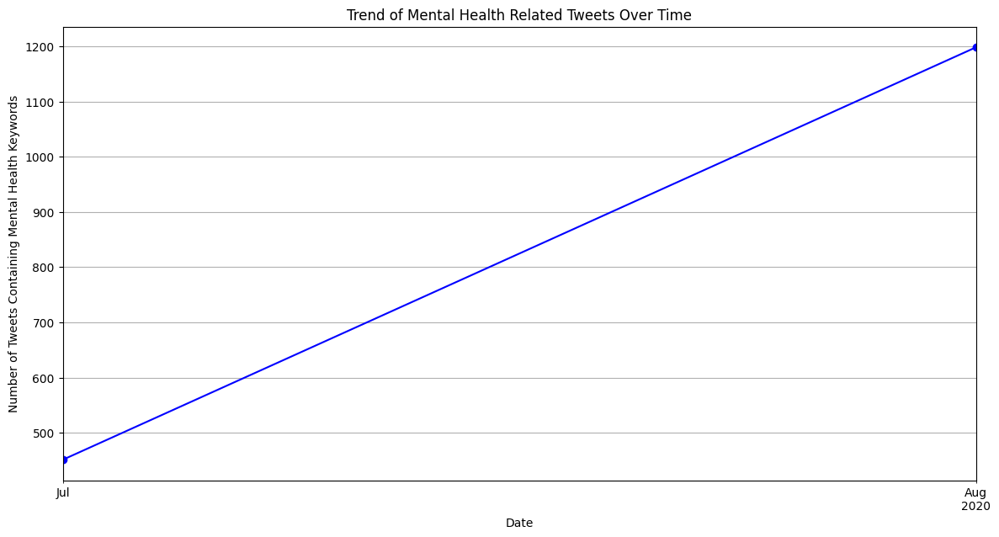

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt


mental_health_keywords = [
    'anxiety', 'depression', 'mental health', 'stress', 'suicide',
    'burnout', 'counseling', 'therapy', 'bipolar', 'ptsd',
    'panic attack', 'insomnia', 'mental illness', 'wellbeing'
]

# Normalize the text and filter tweets containing any mental health-related keywords
tweets_df['text_lower'] = tweets_df['text'].str.lower()
tweets_df['contains_mental_health_keyword'] = tweets_df['text_lower'].apply(
    lambda text: any(keyword in text for keyword in mental_health_keywords)
)

# Filter to only tweets with mental health-related keywords
mental_health_tweets = tweets_df[tweets_df['contains_mental_health_keyword']]

mental_health_tweets['date'] = pd.to_datetime(mental_health_tweets['date'])

trend_over_time = mental_health_tweets.resample('M', on='date').count()

# Plot the trend of mental health-related tweets over time
plt.figure(figsize=(14, 7))
trend_over_time['text'].plot(kind='line', marker='o', color='blue')
plt.title('Trend of Mental Health Related Tweets Over Time')
plt.xlabel('Date')
plt.ylabel('Number of Tweets Containing Mental Health Keywords')
plt.grid(True)
plt.show()


### **Positive and Negative Sentiment Wordcloud**

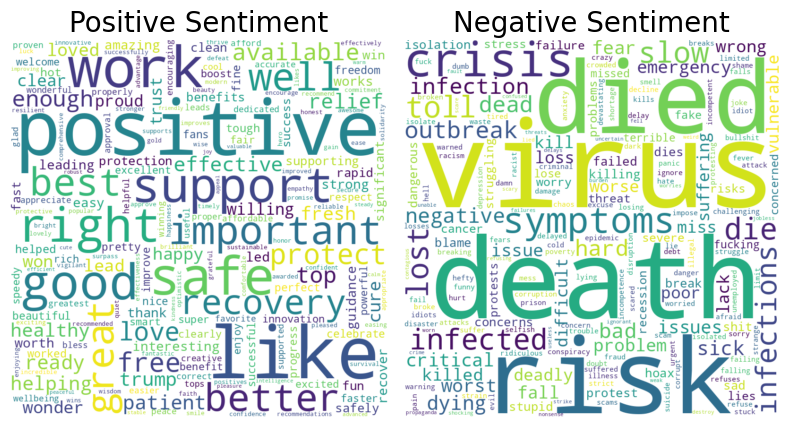

In [ ]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import pandas as pd

merged_df = pd.merge(unnest_tweets, bing, on='word')

# Count occurrences of each word and sentiment
word_sentiment_counts = merged_df.groupby(['word', 'sentiment']).size().reset_index(name='n')

# Create separate DataFrames for positive and negative sentiment words
positive_words = word_sentiment_counts[word_sentiment_counts['sentiment'] == 'positive']
negative_words = word_sentiment_counts[word_sentiment_counts['sentiment'] == 'negative']

# Generate the word clouds for positive and negative sentiment words
wordcloud_positive = WordCloud(width=800, height=800, background_color='white').generate_from_frequencies(dict(zip(positive_words['word'], positive_words['n'])))
wordcloud_negative = WordCloud(width=800, height=800, background_color='white').generate_from_frequencies(dict(zip(negative_words['word'], negative_words['n'])))

# Plot the word clouds
plt.figure(figsize=(8,10))
plt.subplot(121)
plt.imshow(wordcloud_positive, interpolation='bilinear')
plt.title('Positive Sentiment', fontsize=20)
plt.axis('off')

plt.subplot(122)
plt.imshow(wordcloud_negative, interpolation='bilinear')
plt.title('Negative Sentiment', fontsize=20)
plt.axis('off')

plt.tight_layout()
plt.show()


<ipython-input-36-5bf8c79398ea>:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=sentiment_counts, x='n', y='sentiment', palette='viridis', estimator=sum)


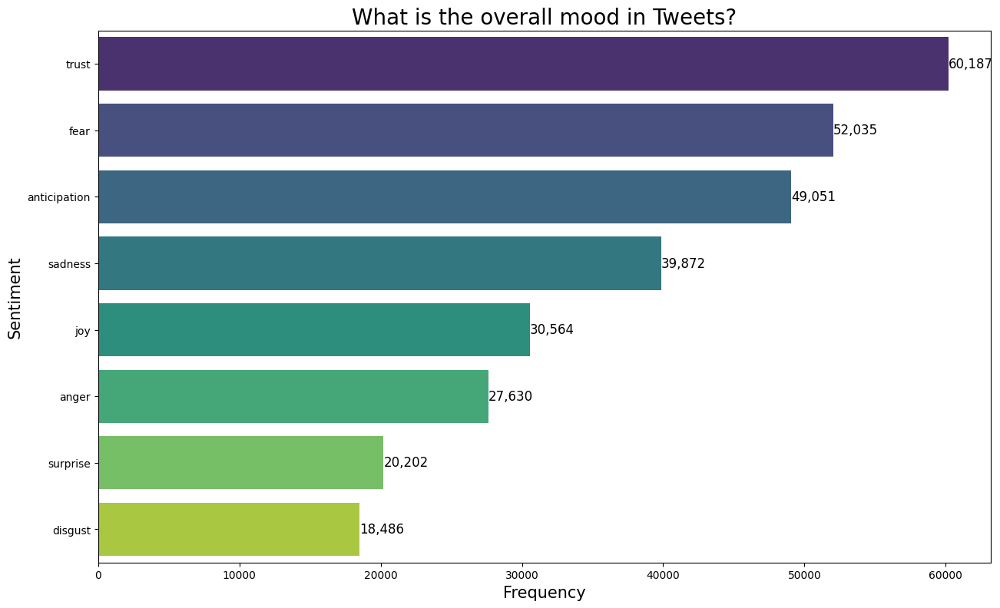

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

merged_df = pd.merge(unnest_tweets, nrc, on='word')

# Filter out positive and negative sentiments
filtered_df = merged_df[~merged_df['sentiment'].isin(['positive', 'negative'])]

# Count occurrences of each sentiment
sentiment_counts = filtered_df['sentiment'].value_counts().reset_index(name='n').sort_values('n', ascending=False)

# Plotting
plt.figure(figsize=(15, 9))
sns.barplot(data=sentiment_counts, x='n', y='sentiment', palette='viridis', estimator=sum)


for sentiment, value in zip(sentiment_counts['sentiment'], sentiment_counts['n']):

    index = sentiment_counts[sentiment_counts['sentiment'] == sentiment].index[0]
    plt.text(value, index, format(value, ','), ha='left', va='center', fontsize=12)

plt.xlabel('Frequency', fontsize=15)
plt.ylabel('Sentiment', fontsize=15)
plt.title('What is the overall mood in Tweets?', fontsize=20)
plt.show()


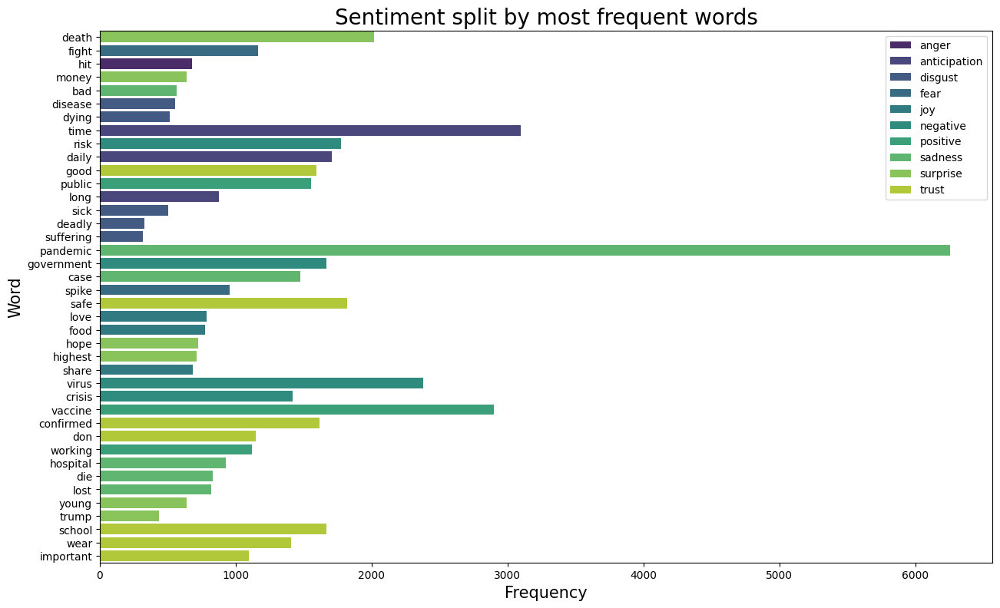

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

merged_df = pd.merge(unnest_tweets, nrc, on='word')

# Count occurrences of each sentiment-word pair
sentiment_word_counts = merged_df.groupby(['sentiment', 'word']).size().reset_index(name='n')

top_words_by_sentiment = sentiment_word_counts.groupby('sentiment').apply(lambda x: x.nlargest(7, 'n')).reset_index(drop=True)

# Plotting
plt.figure(figsize=(15, 9))
sns.barplot(data=top_words_by_sentiment, x='n', y='word', hue='sentiment', dodge=False, palette='viridis')
plt.xlabel('Frequency', fontsize=15)
plt.ylabel('Word', fontsize=15)
plt.title('Sentiment split by most frequent words', fontsize=20)
plt.legend(title=None)
plt.show()


<ipython-input-38-1a32fbf34b24>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=score_counts, x='sentiment_score', y='n', palette='viridis')


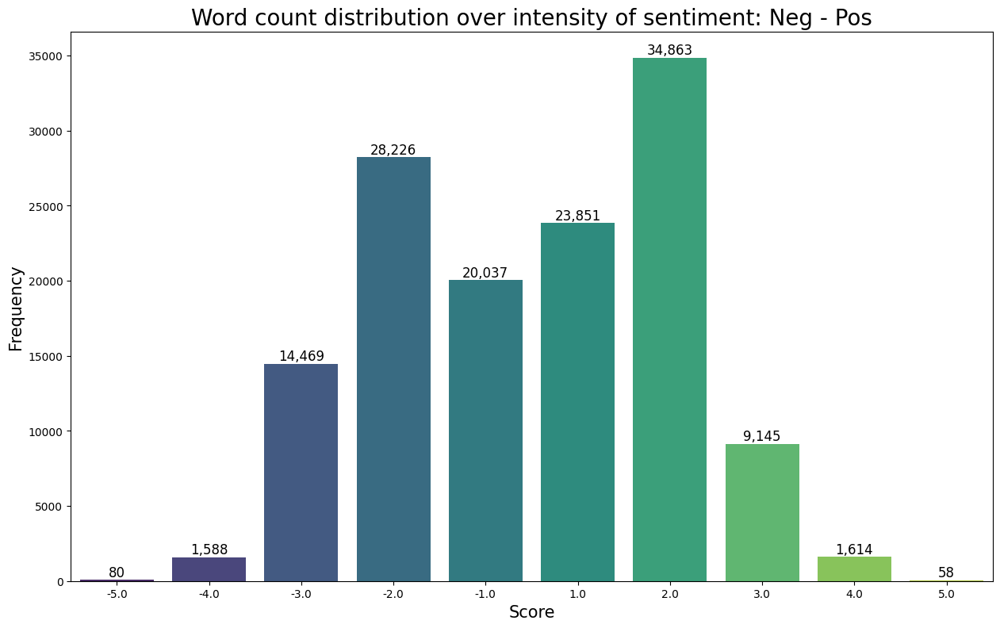

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

merged_df = pd.merge(unnest_tweets, afinn, on='word')

score_counts = merged_df['value'].value_counts().reset_index(name='n')

score_counts.columns = ['sentiment_score', 'n']

score_counts = score_counts.sort_values(by='sentiment_score')

# Plotting
plt.figure(figsize=(15, 9))
sns.barplot(data=score_counts, x='sentiment_score', y='n', palette='viridis')
for i, (score, count) in enumerate(zip(score_counts['sentiment_score'], score_counts['n'])):
    plt.text(i, count, format(count, ','), ha='center', va='bottom', fontsize=12)
plt.xlabel('Score', fontsize=15)
plt.ylabel('Frequency', fontsize=15)a
plt.title('Word count distribution over intensity of sentiment: Neg - Pos', fontsize=20)
plt.xticks(ticks=range(len(score_counts['sentiment_score'])), labels=score_counts['sentiment_score'].astype(str))
plt.show()



### **Filter US and India Tweets**

In [ ]:
import pandas as pd

# Assuming 'unnest_tweets' is your pandas DataFrame containing the tweets and 'bing' is the sentiment lexicon DataFrame

# Filter only the main 3 countries with the most tweets
filtered_data = unnest_tweets[unnest_tweets['country'].isin(["US", "India"])]

# Inner join 'filtered_data' with 'bing' on the 'word' column
merged_data = pd.merge(filtered_data, bing, on='word')

# Count the total tweets for each country
total_tweets = merged_data.groupby('country').size().reset_index(name='total_tweets')

print(total_tweets)


  country  total_tweets
0   India         11708
1      US         24639


**Pure Python implementation of a circle packing layout algorithm**

In [ ]:
pip install circlify

**nxviz is a package for building rational network visualizations using matplotlib as a backend.**

In [ ]:
pip install nxviz

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 332.3/332.3 kB 7.1 MB/s eta 0:00:00


In [ ]:
import pandas as pd
import plotly.graph_objects as go

sentiment_counts = merged_data.groupby(['country', 'sentiment']).size().reset_index(name='counts')

merged_sentiments = pd.merge(sentiment_counts, total_tweets, on='country')
merged_sentiments['sentiment_perc'] = merged_sentiments['counts'] / merged_sentiments['total_tweets']

countries = merged_sentiments['country'].unique().tolist()
sentiments = merged_sentiments['sentiment'].unique().tolist()

country_indices = {country: idx for idx, country in enumerate(countries)}
sentiment_indices = {sentiment: idx + len(countries) for idx, sentiment in enumerate(sentiments)}

source = merged_sentiments.apply(lambda row: country_indices[row['country']], axis=1)
target = merged_sentiments.apply(lambda row: sentiment_indices[row['sentiment']], axis=1)
value = merged_sentiments['sentiment_perc']

# Create the Sankey diagram
fig = go.Figure(data=[go.Sankey(
    node=dict(
      pad=15,
      thickness=20,
      line=dict(color="black", width=0.5),
      label=countries + sentiments,
      color=["blue", "green", "red", "orange"] + ["grey", "darkgrey"],
    ),
    link=dict(
      source=source,
      target=target,
      value=value
    ))])

fig.update_layout(title_text="Relationship between Sentiment and Countries", font_size=10)
fig.show()


In [ ]:
# Filter only main countries with most tweets
main_countries = ["US", "India"]
filtered_data = unnest_tweets[unnest_tweets['country'].isin(main_countries)]
import pandas as pd

In [ ]:
filtered_data.head()

,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,is_retweet,country,word
1,Tom Basile 🇺🇸,"new york, ny","Husband, Father, Columnist & Commentator. Auth...",2009-04-16 20:06:23,2253.0,1677.0,24.0,True,2020-07-25 12:27:17,Hey @Yankees @YankeesPR and @MLB - wouldn't it...,NaN,Twitter for Android,False,US,Hey
1,Tom Basile 🇺🇸,"new york, ny","Husband, Father, Columnist & Commentator. Auth...",2009-04-16 20:06:23,2253.0,1677.0,24.0,True,2020-07-25 12:27:17,Hey @Yankees @YankeesPR and @MLB - wouldn't it...,NaN,Twitter for Android,False,US,@
1,Tom Basile 🇺🇸,"new york, ny","Husband, Father, Columnist & Commentator. Auth...",2009-04-16 20:06:23,2253.0,1677.0,24.0,True,2020-07-25 12:27:17,Hey @Yankees @YankeesPR and @MLB - wouldn't it...,NaN,Twitter for Android,False,US,Yankees
1,Tom Basile 🇺🇸,"new york, ny","Husband, Father, Columnist & Commentator. Auth...",2009-04-16 20:06:23,2253.0,1677.0,24.0,True,2020-07-25 12:27:17,Hey @Yankees @YankeesPR and @MLB - wouldn't it...,NaN,Twitter for Android,False,US,@
1,Tom Basile 🇺🇸,"new york, ny","Husband, Father, Columnist & Commentator. Auth...",2009-04-16 20:06:23,2253.0,1677.0,24.0,True,2020-07-25 12:27:17,Hey @Yankees @YankeesPR and @MLB - wouldn't it...,NaN,Twitter for Android,False,US,YankeesPR


In [ ]:
import pandas as pd

char_sentiment = pd.merge(filtered_data, nrc, on="word")
char_sentiment = char_sentiment[~char_sentiment['sentiment'].isin(["positive", "negative"])]
char_sentiment = char_sentiment.groupby(['country', 'sentiment']).size().reset_index(name='char_sentiment_count')

total_char = pd.merge(filtered_data, nrc, on="word")
total_char = total_char[~total_char['sentiment'].isin(["positive", "negative"])]
total_char = total_char.groupby(['country']).size().reset_index(name='total')

# Printing the DataFrames to verify the results
print(char_sentiment)
print(total_char)


   country     sentiment  char_sentiment_count
0    India         anger                  2321
1    India  anticipation                  4231
2    India       disgust                  1237
3    India          fear                  5326
4    India           joy                  2568
5    India       sadness                  3638
6    India      surprise                  1822
7    India         trust                  4866
8       US         anger                  5434
9       US  anticipation                  8523
10      US       disgust                  3770
11      US          fear                  9284
12      US           joy                  5282
13      US       sadness                  7726
14      US      surprise                  3604
15      US         trust                 10979
  country  total
0   India  26009
1      US  54602


In [ ]:
import pandas as pd
import plotly.graph_objects as go

merged_data = pd.merge(char_sentiment, total_char, on="country")

merged_data['percent'] = (merged_data['char_sentiment_count'] / merged_data['total']) * 100


merged_data = merged_data.drop(columns=['char_sentiment_count', 'total'])

# Pivot the table so that each country becomes a separate column
pivoted_data = merged_data.pivot(index='sentiment', columns='country', values='percent')

categories = pivoted_data.index

country_colors = {
    "US": "red",
    "India": "green"
}

fig = go.Figure()

for idx, col in enumerate(pivoted_data.columns):
    fig.add_trace(go.Scatterpolar(
        r=pivoted_data[col].values,
        theta=categories,
        fill='toself',
        name=col,
        line=dict(color=country_colors[col]),
    ))


fig.update_layout(
    polar=dict(
        radialaxis=dict(
            visible=True,
            range=[0, 25]
        )),
    title="Countries Tweets and Emotion",
    autosize=True
)

# Show the plot
fig.show()


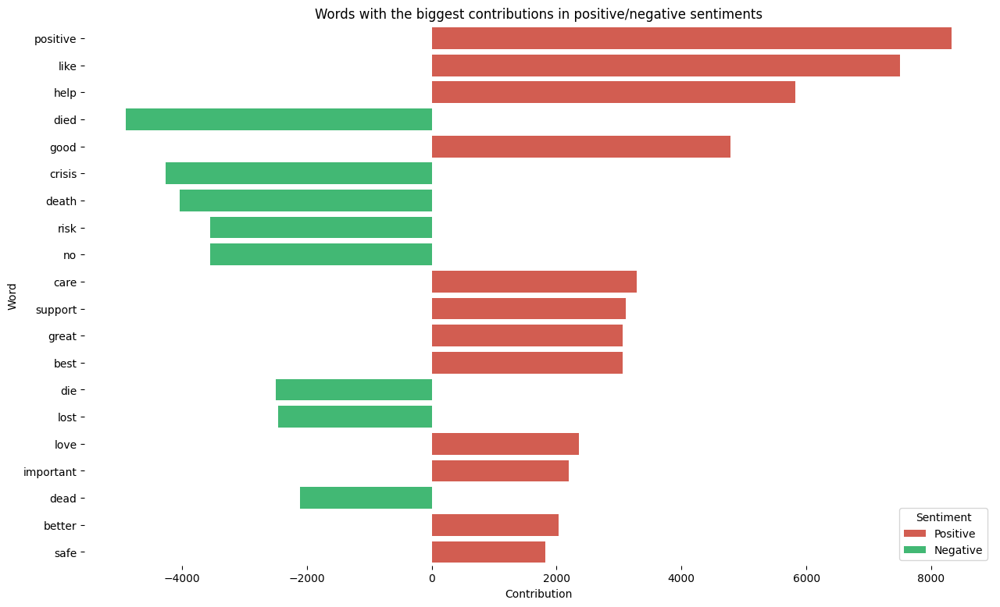

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Merging and counting occurrences
merged_data = pd.merge(unnest_tweets, afinn, on="word")
word_counts = merged_data.groupby(['word', 'value']).size().reset_index(name='n')
word_counts['contribution'] = word_counts['n'] * word_counts['value']
word_counts['sentiment'] = word_counts['contribution'].apply(lambda x: "Positive" if x > 0 else "Negative")

# Selecting top 20 words by contribution
top_words = word_counts.assign(abs_contribution=word_counts['contribution'].abs())
top_words = top_words.sort_values(by='abs_contribution', ascending=False).head(20)

# Plotting
plt.figure(figsize=(15, 9))
color_for_negative = '#e74c3c'
color_for_positive = '#2ecc71'

sns.barplot(
    x='contribution',
    y='word',
    data=top_words,
    hue='sentiment',
    dodge=False,
    palette=[color_for_negative, color_for_positive]
)

plt.xlabel('Contribution')
plt.ylabel('Word')
plt.title('Words with the biggest contributions in positive/negative sentiments')
plt.legend(title='Sentiment', loc='lower right')
sns.despine(left=True, bottom=True)
plt.show()


### **WordCloud Generation**

In [ ]:
pip install wordcloud matplotlib selenium

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.5/10.5 MB 70.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 467.2/467.2 kB 51.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.3/58.3 kB 7.8 MB/s eta 0:00:00


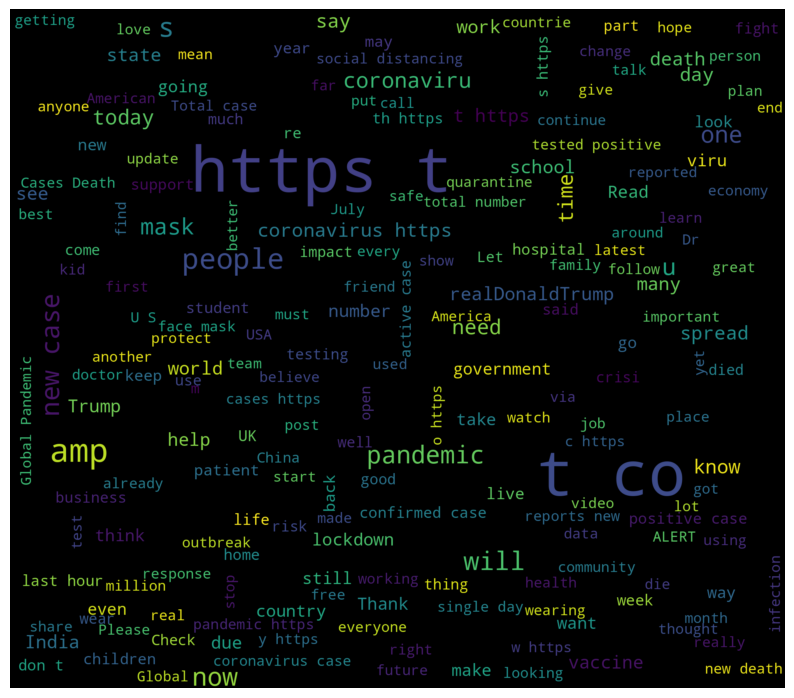

In [ ]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

tweets['text'] = tweets['text'].str.replace('covid', '', case=False)

# Join all tweets into a single string
text = " ".join(tweet for tweet in tweets['text'])

# Generate word cloud
wordcloud = WordCloud(
    width=1992,
    height=1744,
    background_color='black',
    colormap='viridis',  # or any matplotlib colormap
    min_font_size=9,
    max_font_size=160
).generate(text)

# Display the generated word cloud
plt.figure(figsize=(10, 9))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

### **BiGram Creation**

In [ ]:
import pandas as pd
from nltk import bigrams
from nltk.probability import FreqDist
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
import string

filtered_tweets = tweets[tweets['country'].isin(["US", "India"])]

# Drop NA values from 'text' column
filtered_tweets = filtered_tweets.dropna(subset=['text'])

# Tokenize the text and create bigrams
import nltk
nltk.download('punkt')
nltk.download('stopwords')

# Preprocessing function to remove punctuation and stopwords
def preprocess(text):
    # Convert to lowercase
    text = text.lower()
    # Remove punctuation
    text = "".join([char for char in text if char not in string.punctuation])
    # Tokenize
    words = word_tokenize(text)
    # Remove stopwords
    stop_words = set(stopwords.words('english'))
    words = [word for word in words if word not in stop_words]
    return words

# Create bigrams
bigram_list = []
for text in filtered_tweets['text']:
    words = preprocess(text)
    bigram_list.extend(list(bigrams(words)))

# Calculate frequency distribution
bigram_freq = FreqDist(bigram_list)

# Get the 25 most common bigrams
most_common_bigrams = bigram_freq.most_common(25)

# Print or convert to a DataFrame if needed
print(most_common_bigrams)
bigram_df = pd.DataFrame(most_common_bigrams, columns=['bigram', 'count'])

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


[(('19', 'cases'), 2015), (('new', '19'), 1067), (('19', 'pandemic'), 1005), (('24', 'hours'), 869), (('last', '24'), 866), (('positive', 'cases'), 713), (('19', 'positive'), 670), (('19', 'coronavirus'), 660), (('positive', '19'), 649), (('new', 'cases'), 618), (('coronavirus', '19'), 557), (('19', 'vaccine'), 519), (('due', '19'), 483), (('total', 'number'), 458), (('tested', 'positive'), 416), (('deaths', 'reported'), 380), (('19', 'patients'), 347), (('active', 'cases'), 339), (('need', 'plasma'), 327), (('death', 'toll'), 320), (('cases', 'reported'), 316), (('samples', 'tested'), 314), (('need', 'blood'), 300), (('19', 'testing'), 300), (('cases', '19'), 299)]


In [ ]:
bigram_df.head()

,bigram,count
0,"(19, cases)",2015
1,"(new, 19)",1067
2,"(19, pandemic)",1005
3,"(24, hours)",869
4,"(last, 24)",866


<ipython-input-53-721d8f2864c6>:17: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




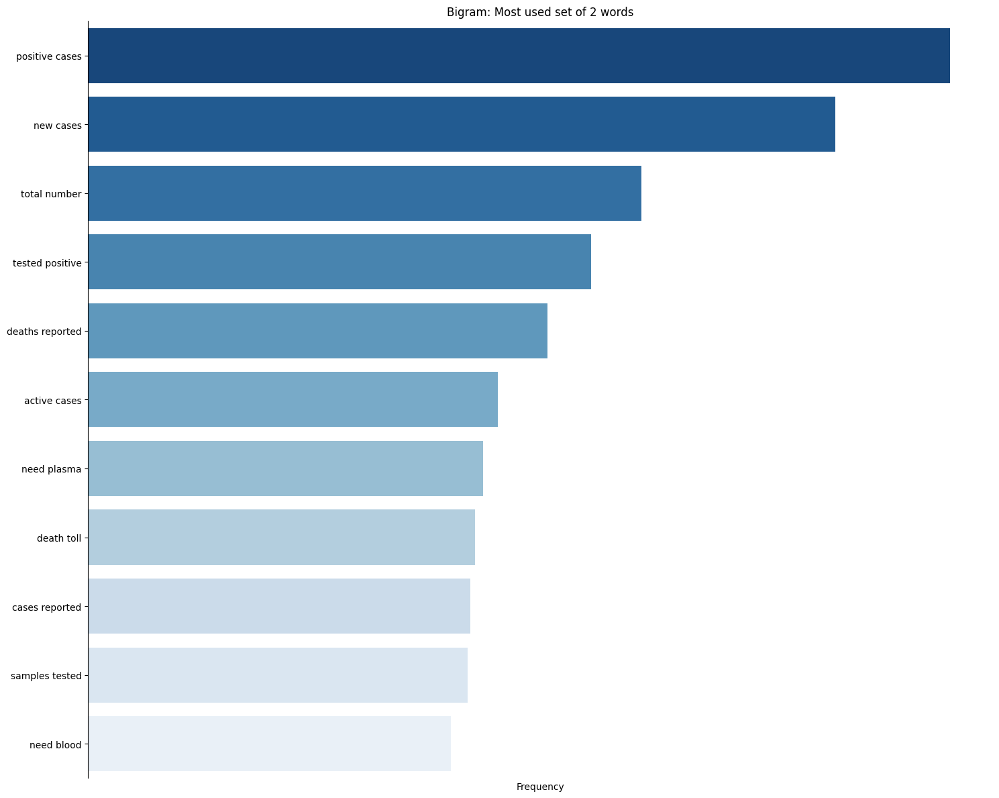

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

bigram_df['bigram_str'] = bigram_df['bigram'].apply(lambda x: ' '.join(x))

bigram_df = bigram_df[~bigram_df['bigram_str'].str.contains(r'\d')]

# Sort the DataFrame based on the frequency count in descending order
bigram_df_sorted = bigram_df.sort_values(by='count', ascending=True)

plt.figure(figsize=(15, 12))

# Create the bar plot using seaborn
barplot = sns.barplot(
    x='count',
    y='bigram_str',
    data=bigram_df_sorted,
    palette=sns.color_palette("Blues", len(bigram_df_sorted))
)

# Remove the axes splines except the left one
sns.despine(left=False, bottom=True, right=True, top=True)

# Set title and labels
plt.title('Bigram: Most used set of 2 words')
plt.xlabel('Frequency')
plt.ylabel('')
plt.gca().invert_yaxis()
plt.xticks([])
plt.tight_layout()
plt.show()


### **TriGram Creation**

In [ ]:
import pandas as pd
from nltk import trigrams
from nltk.probability import FreqDist
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
import re

filtered_tweets = tweets[tweets['country'].isin(["US", "India"])]

# Drop rows with missing text
filtered_tweets = filtered_tweets.dropna(subset=['text'])

import nltk
nltk.download('punkt')
nltk.download('stopwords')

def preprocess(text):
    # Lowercase the text
    text = text.lower()
    # Remove non-alphabetic characters and split into words
    words = re.sub(r'[^a-z\s]', '', text).split()
    # Remove stopwords
    stop_words = set(stopwords.words('english'))
    words = [word for word in words if word not in stop_words]
    return words

# Generate trigrams
trigram_list = []
for text in filtered_tweets['text']:
    tokens = preprocess(text)
    trigram_list.extend(list(trigrams(tokens)))

# Get the 25 most common trigrams
trigram_freq = FreqDist(trigram_list)
most_common_trigrams = trigram_freq.most_common(25)
trigram_df = pd.DataFrame(most_common_trigrams, columns=['trigram', 'count'])
print(trigram_df)


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


                         trigram  count
0         (new, positive, cases)    295
1            (need, blood, type)    293
2       (blood, component, need)    289
3      (component, need, plasma)    286
4         (total, number, cases)    271
5           (india, last, hours)    221
6           (cases, amp, deaths)    215
7           (last, hours, total)    211
8      (cases, deaths, reported)    192
9           (new, cases, deaths)    182
10          (cases, last, hours)    168
11  (hospital, blood, component)    145
12         (reports, new, cases)    145
13     (deaths, reported, india)    141
14        (spike, cases, deaths)    140
15       (reported, india, last)    139
16     (singleday, spike, cases)    121
17        (positive, cases, amp)    115
18       (amp, deaths, reported)    114
19           (need, plasma, ove)    113
20        (new, cases, reported)    112
21         (deaths, last, hours)    108
22      (total, positive, cases)    105
23          (last, hours, tally)    105


<ipython-input-57-9c8d3d6efce9>:14: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




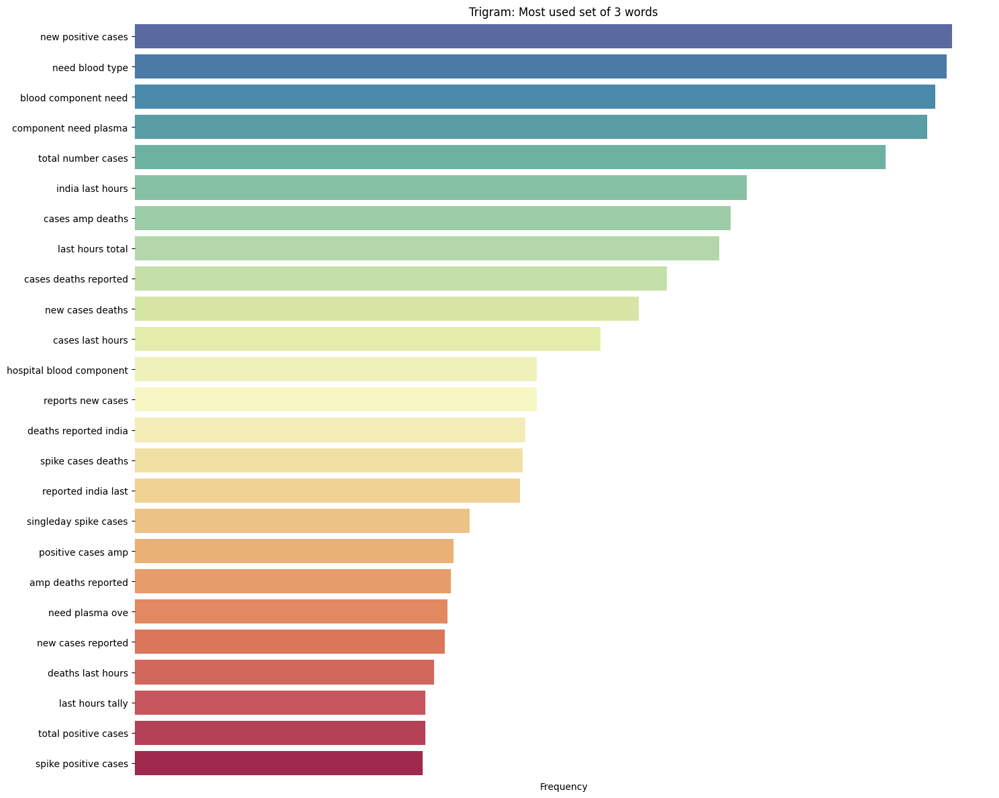

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Convert the trigram tuples into strings if they are not already in that format
trigram_df['trigram_str'] = trigram_df['trigram'].apply(lambda x: ' '.join(x))

trigram_df_sorted = trigram_df.sort_values('count', ascending=True)

plt.figure(figsize=(15, 12))

# Create the bar plot using seaborn
barplot = sns.barplot(
    x='count',
    y='trigram_str',
    data=trigram_df_sorted,
    palette=sns.color_palette("Spectral", n_colors=len(trigram_df_sorted))
)

# Plot
plt.title('Trigram: Most used set of 3 words')
plt.xlabel('Frequency')
plt.ylabel('')

plt.gca().invert_yaxis()
plt.gcf().subplots_adjust(left=0.3)
plt.xticks([])
sns.despine(left=True, bottom=True, right=True, top=True)
plt.tight_layout()
plt.show()


In [ ]:
pip install matplotlib pyvis plotly python-igraph mayavi

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.6/20.6 MB 29.0 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 229.3/229.3 kB 31.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 268.9/268.9 kB 37.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 72.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.1/5.1 MB 93.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 89.5 MB/s eta 0:00:00
  Using cached vtk-9.3.0-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (92.0 MB)
  Created wheel for mayavi: filename=mayavi-4.8.1-cp310-cp310-linux_x86_64.whl size=16167221 sha256=64c0d6ea8c8144fc9f9326f635f327a950ebbea668ee857af966bb6ef0344be7
  Stored in directory: /root/.cache/pip/wheels/c2/6b/23/49aa8ae5063a76fbc35ce90e74f8361cddb9d3a86d5a41ec0a
Successfully bu

### **Social Network Analysis**

### **BiGram Dataframe**

In [ ]:
import pandas as pd
import re
from nltk import bigrams
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords

filtered_tweets = tweets[tweets['country'].isin(["US", "India"])]

# Drop rows with missing text
filtered_tweets = filtered_tweets.dropna(subset=['text'])

# Download necessary NLTK resources
nltk.download('punkt')
nltk.download('stopwords')

# Define a preprocessing function
def preprocess(text):
    text = text.lower()
    text = re.sub(r'[;]|[^a-z\s]', '', text)
    words = word_tokenize(text)
    stop_words = set(stopwords.words('english'))
    words = [word for word in words if word not in stop_words and word != 'amp']
    return words

# Create bigrams from the tokenized words
bigram_list = [
    bigram for text in filtered_tweets['text'] for bigram in bigrams(preprocess(text))
]

# Create a DataFrame from the bigram list
bigram_df = pd.DataFrame(bigram_list, columns=['item1', 'item2'])

# Filter out any bigrams containing numbers or special characters
bigram_df = bigram_df[~(bigram_df['item1'].str.contains(r'\d|[^a-z]') |
                        bigram_df['item2'].str.contains(r'\d|[^a-z]'))]

# Calculate frequency of each bigram
bigram_freq = bigram_df.groupby(['item1', 'item2']).size().reset_index(name='n')

# Sort by frequency in descending order and take the top 25
bigram_freq = bigram_freq.sort_values(by='n', ascending=False).head(25)
bigram_freq.head()


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


,item1,item2,n
194665,new,cases,1314
159961,last,hours,808
38217,cases,deaths,757
221845,positive,cases,754
291147,tested,positive,490


In [ ]:
import pandas as pd

# Assuming 'bigram_freq' is your pandas DataFrame resulting from the previous bigram processing

# Get distinct item1 and rename the column to 'label'
sources = bigram_freq[['item1']].drop_duplicates().rename(columns={'item1': 'label'})

# Get distinct item2 and rename the column to 'label'
destinations = bigram_freq[['item2']].drop_duplicates().rename(columns={'item2': 'label'})

# Display the dataframes
print(sources.head())
print(destinations.head())


           label
194665       new
159961      last
38217      cases
221845  positive
291147    tested
           label
194665     cases
159961     hours
38217     deaths
291147  positive
301520    number


In [ ]:
import pandas as pd

# Assuming 'bigram_freq' is the bigram DataFrame with 'item1', 'item2', and 'n'

# Combine unique 'item1' and 'item2' into a single DataFrame of unique labels
unique_labels = pd.concat([bigram_freq['item1'], bigram_freq['item2']]).unique()
nodes = pd.DataFrame(unique_labels, columns=['label'])

# Create a unique ID for each node
nodes['id'] = range(1, len(nodes) + 1)

# Create the edges DataFrame
# First, merge bigram_freq with nodes to map 'item1' to its unique ID
edges = pd.merge(bigram_freq, nodes, left_on='item1', right_on='label')
edges = edges.rename(columns={'id': 'from'})

# Then, merge with nodes again to map 'item2' to its unique ID
edges = pd.merge(edges, nodes, left_on='item2', right_on='label')
edges = edges.rename(columns={'id': 'to', 'n': 'weight'})

edges = edges[['from', 'to', 'weight']]

nodes.head()


,label,id
0,new,1
1,last,2
2,cases,3
3,positive,4
4,tested,5


In [ ]:
edges.head()

,from,to,weight
0,1,3,1314
1,4,3,754
2,6,3,358
3,7,3,389
4,9,3,333


In [ ]:
pip install networkx

In [ ]:
import networkx as nx

# Create a directed graph from the edges DataFrame
net = nx.from_pandas_edgelist(edges, source='from', target='to', edge_attr='weight', create_using=nx.DiGraph())

# Simplify the graph by removing self-loops
net.remove_edges_from(nx.selfloop_edges(net))

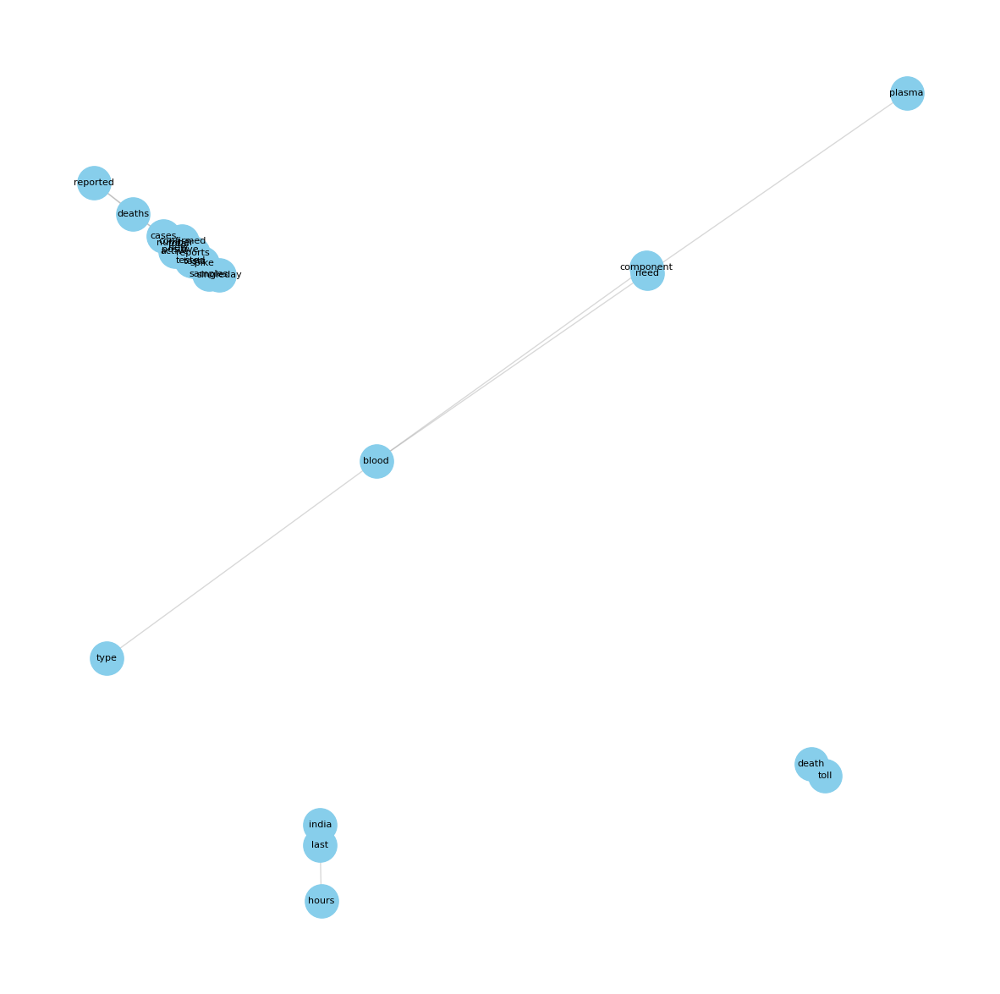

In [ ]:
import matplotlib.pyplot as plt
import networkx as nx
import pandas as pd

# Create a directed graph from the edges and nodes DataFrames
G = nx.from_pandas_edgelist(edges, source='from', target='to', edge_attr=True, create_using=nx.DiGraph())

# Add node labels
for node in G.nodes():
    G.nodes[node]['label'] = nodes[nodes['id'] == node]['label'].values[0]

pos = nx.spring_layout(G, seed=42)

plt.figure(figsize=(15, 15))
edges = nx.draw_networkx_edges(G, pos, alpha=0.3, edge_color='gray', arrows=False)
nodes = nx.draw_networkx_nodes(G, pos, node_color='skyblue', node_size=800)
labels = nx.draw_networkx_labels(G, pos, labels=nx.get_node_attributes(G, 'label'), font_size=8)

plt.axis('off')
plt.show()

### **Aarti**

### **Cluster Analysis**

In [ ]:
import pandas as pd
from sklearn.cluster import KMeans

In [ ]:
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
import string

In [ ]:
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('omw-1.4')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...


True

In [ ]:
tweets_df = pd.read_csv('covid19_tweets.csv')
afinn_lexicon = pd.read_csv('Afinn.csv', encoding='ISO-8859-1')

In [ ]:
# Initializing the WordNet Lemmatizer
lemmatizer = WordNetLemmatizer()

# Defining stopwords and punctuation
stop_words = set(stopwords.words('english'))
punctuation = set(string.punctuation)

In [ ]:
# Function to preprocess text using NLTK
def preprocess_text_nltk(text):
    # Tokenizing text
    tokens = word_tokenize(text)
    # Removing stopwords, punctuation, and lemmatize tokens
    tokens = [lemmatizer.lemmatize(token.lower()) for token in tokens if token.lower() not in stop_words and token.lower() not in punctuation]
    # Joining tokens back into text
    clean_text = ' '.join(tokens)
    return clean_text

In [ ]:
# Applying the preprocessing to the tweet text column
tweets_df['clean_text'] = tweets_df['text'].apply(preprocess_text_nltk)

In [ ]:
# Function to perform sentiment analysis using AFINN lexicon and NLTK(It can also be done using 'Bing' lexicon, I have used 'Afinn' lexicon)
def analyze_sentiment_afinn_nltk(text):
    # Initializing the sentiment score
    score = 0
    # Tokenizing text
    tokens = word_tokenize(text)
    # Iterating through tokens and summing up sentiment scores
    for token in tokens:
        sentiment = afinn_lexicon.loc[afinn_lexicon['word'] == token, 'value'].values
        if sentiment.size > 0:  # Check if the array is not empty
            score += sentiment[0]
    return score

In [ ]:
# Applying sentiment analysis to the clean text column using NLTK and AFINN
tweets_df['sentiment_score_afinn_nltk'] = tweets_df['clean_text'].apply(analyze_sentiment_afinn_nltk)

In [ ]:
# Iterating through each tweet and printing the text alongside the sentiment score
for index, row in tweets_df.iterrows():
    print("Tweet:", row['text'])
    print("Sentiment Score:", row['sentiment_score_afinn_nltk'])
    print("--------------------")

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans

In [ ]:
# Creating TF-IDF vectorizer
vectorizer = TfidfVectorizer(max_df=0.5, min_df=2, stop_words='english')
X = vectorizer.fit_transform(tweets_df['clean_text'])

# Determining the number of clusters
num_clusters = 5

In [ ]:
# Initializing the KMeans model
kmeans = KMeans(n_clusters=num_clusters, random_state=42, n_init=10)
kmeans.fit(X)

In [ ]:
# Assigning the cluster labels to tweets
tweets_df['cluster_label'] = kmeans.labels_

In [ ]:
# Print the top tweets in each cluster along with their sentiment scores
for i in range(num_clusters):
    cluster_tweets = tweets_df[tweets_df['cluster_label'] == i]
    top_tweet = cluster_tweets.iloc[0]
    print("Cluster", i)
    print("Top Tweet:", top_tweet['text'])
    print("Sentiment Score:", top_tweet['sentiment_score_afinn_nltk'])
    print("--------------------")

In [ ]:
import matplotlib.pyplot as plt

# Setting up the plot
plt.figure(figsize=(10, 6))

# Iterating over each cluster label and then plotting the sentiment scores
for cluster_label in range(num_clusters):
    cluster_data = features[cluster_labels == cluster_label]
    plt.scatter(cluster_data, [cluster_label] * len(cluster_data), alpha=0.5, label=f'Cluster {cluster_label}')

# Dynamically adjusting the x-axis limits based on the data range
plt.xlim(features.min(), features.max())


plt.title('Clusters Visualization')
plt.xlabel('Sentiment Score')
plt.ylabel('Cluster Label')

plt.legend()

plt.show()


Interpretation:

- Cluster 0: This cluster appears to concentrate in the negative sentiment region of the x-axis. Tweets in this cluster likely express more negative sentiment related to COVID-19.

- Cluster 1: This cluster seems to have a wider spread of sentiment scores, encompassing both negative and potentially some positive or neutral sentiment.

- Cluster 2: This cluster is positioned around a neutral sentiment score on the x-axis. Tweets in this cluster might express neutral sentiment or possibly a mix of positive and negative sentiment.

- Cluster 3: Similar to Cluster 1, this cluster shows a distribution across the x-axis, potentially containing tweets with a mix of sentiment polarities.

- Cluster 4: This cluster primarily resides in the positive sentiment region of the x-axis. Tweets in this cluster are likely expressing more positive sentiment regarding COVID-19.


### **Monte Carlo Simulation**

In [ ]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.preprocessing import StandardScaler
import re
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
import numpy as np

# Load the data (Assuming you have a tweets DataFrame named tweets_df and a COVID-19 case DataFrame named covid_df)
tweets_df = pd.read_csv('covid19tweets-200.csv', low_memory=False)  # Update with your path
covid_df = pd.read_csv('covid19cases.csv')    # Update with your path

# Check for NaN values
nan_values = tweets_df['user_verified'].isnull().sum()
print("Number of NaN values in 'user_verified' column:", nan_values)

# Drop NaN values
tweets_df.dropna(subset=['user_verified'], inplace=True)

# Recheck for NaN values
nan_values_after = tweets_df['user_verified'].isnull().sum()
print("Number of NaN values after handling:", nan_values_after)

# Preprocess tweet texts (this is a placeholder - you'll need actual preprocessing steps here)
stop_words = set(stopwords.words('english'))
lemmatizer = WordNetLemmatizer()

def preprocess_text(text):
    # Remove special characters and numbers
    text = re.sub(r'\W', ' ', text)
    text = re.sub(r'\d+', ' ', text)
    # Tokenize the text
    tokens = word_tokenize(text)
    # Remove stopwords and single-character tokens
    tokens = [token for token in tokens if token not in stop_words and len(token) > 1]
    # Lemmatize tokens
    tokens = [lemmatizer.lemmatize(token) for token in tokens]
    return ' '.join(tokens)

# Preprocess tweet texts
tweets_df['text_processed'] = tweets_df['text'].apply(lambda x: preprocess_text(x))

tweets_df['text_processed'] = tweets_df['text'].str.lower()

# Create TF-IDF features for tweet text
tfidf_vectorizer = TfidfVectorizer(max_df=0.95, min_df=2, stop_words='english')
tfidf = tfidf_vectorizer.fit_transform(tweets_df['text_processed'])

# Perform LDA for topic modeling
n_topics = 10  # Choose the number of topics
lda = LatentDirichletAllocation(n_components=n_topics, random_state=0)
topics = lda.fit_transform(tfidf)

# Get the dominant topic for each tweet
tweets_df['dominant_topic'] = topics.argmax(axis=1)

# Scale numerical features
scaler = StandardScaler()
covid_df[['Confirmed', 'Recovered', 'Deaths']] = scaler.fit_transform(covid_df[['Confirmed', 'Recovered', 'Deaths']])

# Use Monte Carlo Simulation for forecasting
def monte_carlo_simulation(data, n_simulations=1000):
    # Calculate historical daily changes
    daily_changes = np.diff(data)

    # Calculate mean and standard deviation of historical daily changes
    mean_change = np.mean(daily_changes)
    std_change = np.std(daily_changes)

    # Use Monte Carlo Simulation to generate multiple scenarios
    simulations = np.random.normal(mean_change, std_change, size=(n_simulations, len(data)))
    cumulative_simulations = np.cumsum(simulations, axis=1)
    return cumulative_simulations

# Use Monte Carlo Simulation to forecast future COVID-19 cases
def forecast_cases(cases, n_days, n_simulations=1000):
    last_known_case = cases[-1]
    future_cases = monte_carlo_simulation(np.repeat(last_known_case, n_days), n_simulations)
    return future_cases

# Forecast COVID-19 cases for a specific location and date
def forecast_and_recommend(location, date, tweets_df, covid_df, n_recommendations=5):
    # Filter COVID data for the location
    location_data = covid_df[covid_df['Country/Region'] == location]

    # Convert date to match the format in the DataFrame
    date = pd.to_datetime(date).strftime('%Y-%m-%d')

    # Filter data for the specified date
    date_data = location_data[location_data['Date'] == date]

    # Check if data is available for the specified date
    if date_data.empty:
        return "No COVID data available for the specified location and date"

    # Extract historical cases
    historical_cases = date_data['Confirmed'].values

    # Forecast future cases
    n_days = 7  # Number of days to forecast
    future_cases = forecast_cases(historical_cases, n_days)

    # Get the dominant topic related to increasing cases
    increasing_topic = tweets_df[tweets_df['dominant_topic'] == np.argmax(historical_cases)]['text']

    # Recommend tweets based on the dominant topic related to increasing cases
    recommended_tweets = increasing_topic.sample(n=n_recommendations).tolist()

    # Format recommended tweets nicely
    formatted_tweets = []
    for tweet in recommended_tweets:
        formatted_tweets.append(f"Tweet: {tweet}\n")

    return formatted_tweets

# Example usage:
location = 'China'
date = '2020-01-22'  # Example date, format should match your dataset
recommended_tweets = forecast_and_recommend(location, date, tweets_df, covid_df)
for i, tweet in enumerate(recommended_tweets, 1):
    print(f"Recommendation {i}:\n{tweet}\n")



In [ ]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.preprocessing import StandardScaler
import re
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
import numpy as np

# Load the data (Assuming you have a tweets DataFrame named tweets_df and a COVID-19 case DataFrame named covid_df)
tweets_df = pd.read_csv('covid19tweets-200.csv', low_memory=False)  # Update with your path
covid_df = pd.read_csv('covid19cases.csv')    # Update with your path

# Check for NaN values
nan_values = tweets_df['user_verified'].isnull().sum()
print("Number of NaN values in 'user_verified' column:", nan_values)

# Drop NaN values
tweets_df.dropna(subset=['user_verified'], inplace=True)

# Recheck for NaN values
nan_values_after = tweets_df['user_verified'].isnull().sum()
print("Number of NaN values after handling:", nan_values_after)

# Preprocess tweet texts (this is a placeholder - you'll need actual preprocessing steps here)
stop_words = set(stopwords.words('english'))
lemmatizer = WordNetLemmatizer()

def preprocess_text(text):
    # Remove special characters and numbers
    text = re.sub(r'\W', ' ', text)
    text = re.sub(r'\d+', ' ', text)
    # Tokenize the text
    tokens = word_tokenize(text)
    # Remove stopwords and single-character tokens
    tokens = [token for token in tokens if token not in stop_words and len(token) > 1]
    # Lemmatize tokens
    tokens = [lemmatizer.lemmatize(token) for token in tokens]
    return ' '.join(tokens)

# Preprocess tweet texts
tweets_df['text_processed'] = tweets_df['text'].apply(lambda x: preprocess_text(x))

tweets_df['text_processed'] = tweets_df['text'].str.lower()

# Create TF-IDF features for tweet text
tfidf_vectorizer = TfidfVectorizer(max_df=0.95, min_df=2, stop_words='english')
tfidf = tfidf_vectorizer.fit_transform(tweets_df['text_processed'])

# Perform LDA for topic modeling
n_topics = 10  # Choose the number of topics
lda = LatentDirichletAllocation(n_components=n_topics, random_state=0)
topics = lda.fit_transform(tfidf)

# Get the dominant topic for each tweet
tweets_df['dominant_topic'] = topics.argmax(axis=1)

# Scale numerical features
scaler = StandardScaler()
covid_df[['Confirmed', 'Recovered', 'Deaths']] = scaler.fit_transform(covid_df[['Confirmed', 'Recovered', 'Deaths']])

# Use Monte Carlo Simulation for forecasting
def monte_carlo_simulation(data, n_simulations=1000):
    # Calculate historical daily changes
    daily_changes = np.diff(data)

    # Calculate mean and standard deviation of historical daily changes
    mean_change = np.mean(daily_changes)
    std_change = np.std(daily_changes)

    # Use Monte Carlo Simulation to generate multiple scenarios
    simulations = np.random.normal(mean_change, std_change, size=(n_simulations, len(data)))
    cumulative_simulations = np.cumsum(simulations, axis=1)
    return cumulative_simulations

# Use Monte Carlo Simulation to forecast future COVID-19 cases
def forecast_cases(cases, n_days, n_simulations=1000):
    last_known_case = cases[-1]
    future_cases = monte_carlo_simulation(np.repeat(last_known_case, n_days), n_simulations)
    return future_cases

# Forecast COVID-19 cases for a specific location and date
def forecast_and_recommend(location, date, tweets_df, covid_df, n_recommendations=5):
    # Filter COVID data for the location
    location_data = covid_df[(covid_df['Country/Region'] == location) & (covid_df['Date'] == date)]

    # Check if data is available for the specified location and date
    if location_data.empty:
        return f"No COVID data available for {location} on {date}"

    # Get the number of cases
    num_cases = scaler.inverse_transform(location_data[['Confirmed', 'Recovered', 'Deaths']])[0][0]

    # Extract historical cases
    historical_cases = location_data['Confirmed'].values

    # Forecast future cases
    n_days = 7  # Number of days to forecast
    future_cases = forecast_cases(historical_cases, n_days)

    # Get the dominant topic related to increasing cases
    increasing_topic = tweets_df[tweets_df['dominant_topic'] == np.argmax(historical_cases)]['text']

    # Recommend tweets based on the dominant topic related to increasing cases
    recommended_tweets = increasing_topic.sample(n=n_recommendations).tolist()

    # Format recommended tweets nicely
    formatted_tweets = "\n".join([f"Tweet {i+1}: {tweet}" for i, tweet in enumerate(recommended_tweets, 1)])

    return f"Number of COVID-19 cases in {location} on {date}: {num_cases}\n\nRecommended Tweets:\n{formatted_tweets}"

# Example usage:
location = 'Thailand'
date = '2020-01-22'  # Example date, format should match your dataset
recommendations = forecast_and_recommend(location, date, tweets_df, covid_df)
print(recommendations)

### **Time Series Analysis**

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

In [ ]:
# Loading the required data
tweets_df = pd.read_csv("covid19_tweets.csv")

In [ ]:
# Extracting relevant columns
tweets_data = tweets_df[['date', 'text']]

# Dropping the rows with missing values without modifying the original DataFrame
tweets_data = tweets_data.dropna().copy()


# Converting 'date' column to datetime format
tweets_data['date'] = pd.to_datetime(tweets_data['date'])


In [ ]:
# Loading the NRC lexicon data(Afinn lexicon data or Bing lexicon data can also be used)
nrc_lexicon = pd.read_csv('NRC.csv')

# Converting 'word' column to lowercase for case-insensitive matching
nrc_lexicon['word'] = nrc_lexicon['word'].str.lower()

# Merging the sentiment scores with tweets data based on common words
tweets_data['text'] = tweets_data['text'].str.lower()  # Convert text to lowercase for matching
tweets_data['sentiment'] = tweets_data['text'].apply(lambda text: nrc_lexicon[nrc_lexicon['word'].isin(text.split())]['sentiment'].tolist())

# Exploding the 'sentiment' list to create separate rows for each sentiment
tweets_data = tweets_data.explode('sentiment')


In [ ]:
# Encoding sentiment labels into numerical values
sentiment_mapping = {
    'trust': 1,
    'fear': -1,
    'negative': -1,
    'sadness': -1,
    'anger': -1,
    # More mappings can be added as required
}

tweets_data['sentiment_value'] = tweets_data['sentiment'].map(sentiment_mapping)

# Aggregating the sentiment scores over time (e.g., daily)
daily_sentiment = tweets_data.groupby('date')['sentiment_value'].sum()

In [ ]:
# Plotting sentiment trends
daily_sentiment.plot(kind='line', figsize=(10, 6), title='Sentiment Trends over Time')
plt.xlabel('Date')
plt.ylabel('Cumulative Sentiment Score')
plt.grid(True)
plt.legend()
plt.show()